In [1]:
import os
import sys
sys.path.append(os.path.abspath("/users/amtseng/tfmodisco/notebooks/reports/"))
sys.path.append(os.path.abspath("/users/amtseng/tfmodisco/src/"))
import plot.viz_sequence as viz_sequence
from util import figure_to_vdom_image, create_motif_similarity_matrix, purine_rich_motif
import h5py
import numpy as np
import sklearn.cluster
import scipy.stats
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors
import matplotlib.font_manager as font_manager
import vdom.helpers as vdomh
from IPython.display import display
import tqdm
tqdm.tqdm_notebook(range(1))

/users/amtseng/miniconda3/envs/tfmodisco-mini/lib/python3.7/site-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/1 [00:00<?, ?it/s]

In [2]:
# Plotting defaults
font_manager.fontManager.ttflist.extend(
    font_manager.createFontList(
        font_manager.findSystemFonts(fontpaths="/users/amtseng/modules/fonts")
    )
)
plot_params = {
    "figure.titlesize": 22,
    "axes.titlesize": 16,
    "axes.labelsize": 16,
    "legend.fontsize": 18,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "font.family": "Roboto",
    "font.weight": "bold",
    "svg.fonttype": "none"
}
plt.rcParams.update(plot_params)

/users/amtseng/miniconda3/envs/tfmodisco-mini/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The createFontList function was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use FontManager.addfont instead.
  after removing the cwd from sys.path.


In [3]:
if "TFM_TF_NAME" in os.environ:
    tf_name = os.environ["TFM_TF_NAME"]
    if "TFM_TASK_INDEX" in os.environ:
        task_index = int(os.environ["TFM_TASK_INDEX"])
    else:
        task_index = None
else:
    tf_name = "MAX"
    task_index = 2

In [4]:
if task_index is None:
    out_path = "/users/amtseng/tfmodisco/figures/fold_model_motif_reproducibility/%s_fold_model_motif_reproducibility" % tf_name
else:
    out_path = "/users/amtseng/tfmodisco/figures/fold_model_motif_reproducibility/%s_task%d_fold_model_motif_reproducibility" % (tf_name, task_index)
os.makedirs(out_path, exist_ok=True)

tf_num_tasks = {
    "E2F6": 2,
    "FOXA2": 4,
    "SPI1": 4,
    "CEBPB": 7,
    "MAX": 7,
    "GABPA": 9,
    "MAFK": 9,
    "JUND": 14,
    "NR3C1-reddytime": 16,
    "REST": 20
}

tf_best_model_types = {
    "E2F6": list("MM"),
    "FOXA2": list("SSMM"),
    "SPI1": list("MSSS"),
    "CEBPB": list("MMMMSMM"),
    "MAX": list("MMSMMSS"),
    "GABPA": list("MMMSMMMMM"),
    "MAFK": list("MMMMMMMMM"),
    "JUND": list("SMMSMSSSSSSSMS"),
    "NR3C1-reddytime": list("MMMSMMSMMMMSMMMM"),
    "REST": list("MMMMMMMMMSMMSMMSMMMM")
}

num_tasks = tf_num_tasks[tf_name]
best_model_types = tf_best_model_types[tf_name]

seed = 20210910

motif_file = "/users/amtseng/tfmodisco/results/motifs/tfmodisco/%s_tfmodisco_motifs.h5" % tf_name

multitask_finetune_model_def_tsv = "/users/amtseng/tfmodisco/results/model_stats/multitask_profile_finetune_stats.tsv"
singletask_finetune_model_def_tsv = "/users/amtseng/tfmodisco/results/model_stats/singletask_profile_finetune_stats.tsv"

### Helper functions

In [5]:
sanitize_fold = lambda fold: "F" + fold.split("_")[1]
sanitize_task = lambda task: "T" + task.split("_")[1]

def import_all_tfmodisco_motifs(motif_file, task_index=None):
    """
    From a file containing all motifs for that TF, imports the
    trimmed CWMs of all conditions as a dictionary. Returns a dictionary
    of motifs, mapping a unique key to the trimmed CWM.
    If `task_index` is given, only import the single-task motifs and
    fine-tuned multi-task motifs for that task.
    """
    motifs = {}
    with h5py.File(motif_file, "r") as f:
        # Multi-task, all 10 folds
        if task_index is None:
            mt = f["multitask"]
            for fold in mt.keys():
                mt_fold = mt[fold]
                for key in ("count", "profile"):
                    mt_fold_key = mt_fold[key]
                    for motif_key in mt_fold_key.keys():
                        if motif_key.startswith("0_"):
                            # Positive metacluster only
                            name = "MT:%s:%s:%s" % (sanitize_fold(fold), key[0].upper(), motif_key)
                            motifs[name] = purine_rich_motif(mt_fold_key[motif_key]["cwm_trimmed"][:])
        
        # Single-task, all 10 folds for all tasks or just a single task
        st = f["singletask"]
        for task in (st.keys() if task_index is None else ["task_%d" % task_index]):
            st_task = st[task]
            for fold in st_task.keys():
                st_task_fold = st_task[fold]
                for key in ("count", "profile"):
                    st_task_fold_key = st_task_fold[key]
                    for motif_key in st_task_fold_key.keys():
                        if motif_key.startswith("0_"):
                            # Positive metacluster only
                            name = "ST:%s:%s:%s:%s" % (sanitize_task(task), sanitize_fold(fold), key[0].upper(), motif_key)
                            motifs[name] = purine_rich_motif(st_task_fold_key[motif_key]["cwm_trimmed"][:])
        
        # Multi-task fine-tune, all tasks plus aggregate task or just a single task
        mtft = f["multitask_finetune"]
        for task in (mtft.keys() if task_index is None else ["task_%d" % task_index]):
            mtft_task = mtft[task]
            for key in ("count", "profile"):
                mtft_task_key = mtft_task[key]
                for motif_key in mtft_task_key.keys():
                    if motif_key.startswith("0_"):
                        # Positive metacluster only
                        name = "MTFT:%s:%s:%s" % (sanitize_task(task), key[0].upper(), motif_key)
                        motifs[name] = purine_rich_motif(mtft_task_key[motif_key]["cwm_trimmed"][:])
        
        # Single-task fine-tune, all tasks or just a single task
        stft = f["singletask_finetune"]
        for task in (stft.keys() if task_index is None else ["task_%d" % task_index]):
            stft_task = stft[task]
            for key in ("count", "profile"):
                stft_task_key = stft_task[key]
                for motif_key in stft_task_key.keys():
                    if motif_key.startswith("0_"):
                        # Positive metacluster only
                        name = "STFT:%s:%s:%s" % (sanitize_task(task), key[0].upper(), motif_key)
                        motifs[name] = purine_rich_motif(stft_task_key[motif_key]["cwm_trimmed"][:])
        
    return motifs

In [6]:
def get_num_seqlets(motif_key):
    """
    Fetches the number of seqlets initially mapped to the given motif from the
    original TF-MoDISco file.
    """
    base_path = "/users/amtseng/tfmodisco/results/tfmodisco"
    cond_type = motif_key.split(":")[0]
    if cond_type == "MTFT":
        # Get best fold
        best_mt_fold = None
        with open(multitask_finetune_model_def_tsv, "r") as f:
            for line in f:
                tokens = line.strip().split("\t")
                if tokens[0] == tf_name and int(tokens[1]) == num_tasks - 1:
                    assert best_mt_fold is None
                    best_mt_fold = int(tokens[2])
        task, head, pattern = motif_key.split(":")[1:]
        task = task[1:]
        head = "profile" if head == "P" else "count"
        path = os.path.join(
            base_path,
            "multitask_profile_finetune",
            "%s_multitask_profile_finetune_fold%d" % (tf_name, best_mt_fold)
        )
        if task == "agg":
            path = os.path.join(
                path,
                "%s_multitask_profile_finetune_fold%d_%s_tfm.h5" % (tf_name, best_mt_fold, head)
            )
        else:
            path = os.path.join(
                path,
                "%s_multitask_profile_finetune_task%s_fold%d_%s_tfm.h5" % (tf_name, task, best_mt_fold, head)
            )
    elif cond_type == "STFT":
        # Get best fold
        best_st_folds = []
        with open(singletask_finetune_model_def_tsv, "r") as f:
            for line in f:
                tokens = line.strip().split("\t")
                if tokens[0] == tf_name:
                    best_st_folds.append(int(tokens[2]))
        assert len(best_st_folds) == num_tasks
        task, head, pattern = motif_key.split(":")[1:]
        task = task[1:]
        head = "profile" if head == "P" else "count"
        best_st_fold = best_st_folds[int(task)]
        path = os.path.join(
            base_path,
            "singletask_profile_finetune",
            "%s_singletask_profile_finetune_fold%d" % (tf_name, best_st_fold),
            "task_%s" % task,
            "%s_singletask_profile_finetune_task%s_fold%d_%s_tfm.h5" % (tf_name, task, best_st_fold, head)
        )        
    elif cond_type == "MT":
        fold, head, pattern = motif_key.split(":")[1:]
        fold = fold[1:]
        head = "profile" if head == "P" else "count"
        path = os.path.join(
            base_path,
            "multitask_profile",
            "%s_multitask_profile_fold%s" % (tf_name, fold),
            "%s_multitask_profile_fold%s_%s_tfm.h5" % (tf_name, fold, head)
        )
    elif cond_type == "ST":
        task, fold, head, pattern = motif_key.split(":")[1:]
        task = task[1:]
        fold = fold[1:]
        head = "profile" if head == "P" else "count"
        path = os.path.join(
            base_path,
            "singletask_profile",
            "%s_singletask_profile_fold%s" % (tf_name, fold),
            "task_%s" % task,
            "%s_singletask_profile_task%s_fold%s_%s_tfm.h5" % (tf_name, task, fold, head)
        )
    else:
        raise ValueError("Unknown model condition type")
        
    # Now that we have the path, import the number of seqlets for the given pattern
    metacluster_key, pattern_key = pattern.split("_")
    with h5py.File(path, "r") as f:
        metacluster = f["metacluster_idx_to_submetacluster_results"]["metacluster_%s" % metacluster_key]
        patterns = metacluster["seqlets_to_patterns_result"]["patterns"]
        seqlets = patterns["pattern_%s" % pattern_key]["seqlets_and_alnmts"]["seqlets"]
        return len(seqlets)

In [7]:
def make_cdf(ax, data, steps=1000, density=False, inverse=False, **kwargs):
    """
    Plots a CDF to the given axes. `steps` is the number of steps in the
    CDF. If `inverse` is True, plots an inverse CDF (AKA survivorship plot).
    `density` is whether or not to normalize to fractions.
    """
    hist, bin_edges = np.histogram(data, bins=steps)
    if inverse:
        cumsum = len(data) - np.cumsum(hist)
    else:
        cumsum = np.cumsum(hist)
    if density:
        cumsum = cumsum / len(data)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2.
    ax.step(bin_centers, cumsum, **kwargs)

In [8]:
def cluster_matrix_indices(matrix, num_clusters):
    """
    Clusters matrix using k-means. Always clusters on the first
    axis. Returns the indices needed to optimally order the matrix
    by clusters.
    """
    if len(matrix) == 1:
        # Don't cluster at all
        return np.array([0])

    num_clusters = min(num_clusters, len(matrix))
    
    # Perform k-means clustering
    kmeans = sklearn.cluster.MiniBatchKMeans(n_clusters=num_clusters)
    cluster_assignments = kmeans.fit_predict(matrix)

    # Order cluster centers to determine optimal ordering
    kmeans_centers = kmeans.cluster_centers_
    cluster_order = np.argsort(-np.mean(kmeans_centers, axis=1))

    # Order the peaks so that the cluster assignments follow the optimal ordering
    cluster_inds = []
    for cluster_id in cluster_order:
        cluster_inds.append(np.where(cluster_assignments == cluster_id)[0])
    cluster_inds = np.concatenate(cluster_inds)
    return cluster_inds, cluster_assignments[cluster_inds]

In [9]:
def plot_motif_examples(motif_keys, motifs, cond_names, cond_inds):
    """
    Creates a table of motifs. The full set of motifs and keys
    are given, and `cond_names` and `cond_inds` are parallel lists
    containing conditions and a list of indices to plot for each.
    A pair of columns is created for each condition.
    """
    assert len(cond_names) == len(cond_inds)
    cols = []
    heads = []
    for i in range(len(cond_names)):
        cols.append(vdomh.col(style={"width": str(10 / len(cond_inds)) + "%"}))
        cols.append(vdomh.col(style={"width": str(90 / len(cond_inds)) + "%"}))
        heads.append(vdomh.th("Motif ID", style={"text-align": "center"}))
        heads.append(vdomh.th("Motif (%s)" % cond_names[i], style={"text-align": "center"}))
    colgroup = vdomh.colgroup(*cols)
    header = vdomh.thead(vdomh.tr(*heads))

    max_length = max([len(inds) for inds in cond_inds])
    rows = []
    for row_i in range(max_length):
        row = []
        for col_i in range(len(cond_names)):
            if row_i < len(cond_inds[col_i]):
                motif_i = cond_inds[col_i][row_i]
                fig = viz_sequence.plot_weights(
                    motifs[motif_i], subticks_frequency=100, figsize=(20, 4), return_fig=True
                )
                fig.tight_layout()
                row.extend([
                    vdomh.td(motif_keys[motif_i]),
                    vdomh.td(figure_to_vdom_image(fig))
                ])
            else:
                row.extend([vdomh.td(), vdomh.td()])
        rows.append(vdomh.tr(*row))
    display(vdomh.table(colgroup, header, vdomh.tbody(*rows)))
    plt.close("all")

### Import motifs and construct similarity matrix

In [10]:
motif_keys, motifs = zip(*import_all_tfmodisco_motifs(motif_file, task_index).items())
motif_keys, motifs = list(motif_keys), list(motifs)

In [11]:
raw_sim_matrix = create_motif_similarity_matrix(motifs, mean_normalize=False)

  0%|          | 0/97 [00:00<?, ?it/s]

In [12]:
# Extract the number of seqlest for each motif
motif_num_seqlets = np.array([
    get_num_seqlets(key) for key in tqdm.notebook.tqdm(motif_keys)
])

  0%|          | 0/97 [00:00<?, ?it/s]

### Plot similarity of each motif to closest motif in each condition

In [13]:
# First, create a dictionary mapping each condition to the column indices
cond_inds = {}
for i, key in enumerate(motif_keys):
    cond_key = ":".join(key.split(":")[:-2])  # Strip off last two pieces
    try:
        cond_inds[cond_key].append(i)
    except KeyError:
        cond_inds[cond_key] = [i]
for key in list(cond_inds.keys()):
    cond_inds[key] = np.array(cond_inds[key])

In [14]:
# Normalize the number of seqlets over each condition separately
motif_prop_seqlets = np.empty(len(motif_num_seqlets))
for inds in cond_inds.values():
    motif_prop_seqlets[inds] = motif_num_seqlets[inds] / np.sum(motif_num_seqlets[inds])

In [15]:
# Construct a limited version of the similarity matrix, where the columns
# are the highest similarity over the entire condition
cond_sim_matrix = np.empty((len(motif_keys), len(cond_inds)))
for i, cond_key in enumerate(cond_inds.keys()):
    cond_sim_matrix[:, i] = np.max(raw_sim_matrix[:, cond_inds[cond_key]], axis=1)

In [16]:
# Order similarity matrix rows by optimal cluster order
order_inds, cluster_ids = cluster_matrix_indices(
    cond_sim_matrix,
    max([len(inds) for inds in cond_inds.values()])
    # Maximum number of clusters should be biggest condition size
)
sorted_cond_sim_matrix = cond_sim_matrix[order_inds]

# Order motif keys and motifs
sorted_motif_keys = [motif_keys[i] for i in order_inds]
sorted_motifs = [motifs[i] for i in order_inds]
sorted_motif_prop_seqlets = np.array([motif_prop_seqlets[i] for i in order_inds])

# Sort each matrix row independently, most to least similar
sorted_cond_sim_matrix = -np.sort(-sorted_cond_sim_matrix, axis=1)  # Negatives make it sort descending

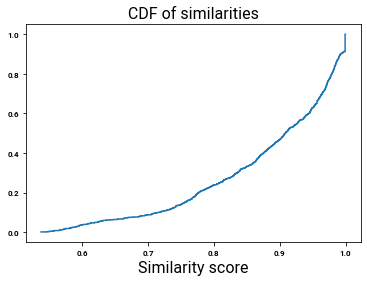

In [17]:
fig, ax = plt.subplots()
make_cdf(ax, np.ravel(cond_sim_matrix), density=True)
ax.set_title("CDF of similarities")
ax.set_xlabel("Similarity score")
plt.show()

# # Normalize the matrix entries to percentile
# cond_sim_matrix_perc = scipy.stats.rankdata(cond_sim_matrix).reshape(cond_sim_matrix.shape) / cond_sim_matrix.size

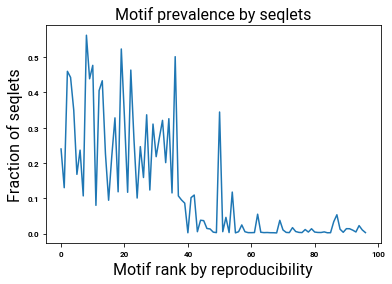

In [18]:
fig, ax = plt.subplots()
ax.set_title("Motif prevalence by seqlets")
ax.set_xlabel("Motif rank by reproducibility")
ax.set_ylabel("Fraction of seqlets")
ax.plot(sorted_motif_prop_seqlets)
plt.show()

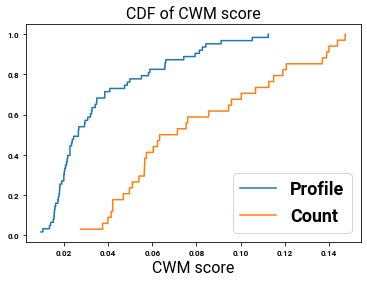

In [19]:
# Extract the CWM score of each motif in order
sorted_motif_scores = np.array([np.max(cwm) for cwm in sorted_motifs])

# Separate out profile and count CWMs
profile_inds = np.array([i for i in range(len(sorted_motif_keys)) if sorted_motif_keys[i].split(":")[-2] == "P"])
count_inds = np.array([i for i in range(len(sorted_motif_keys)) if sorted_motif_keys[i].split(":")[-2] == "C"])

fig, ax = plt.subplots()
make_cdf(ax, sorted_motif_scores[profile_inds], density=True, label="Profile")
make_cdf(ax, sorted_motif_scores[count_inds], density=True, label="Count")
ax.set_title("CDF of CWM score")
ax.set_xlabel("CWM score")
plt.legend()
plt.show()

# Normalize the CWM scores to map to percentile (i.e. map CDF x-axis to y-axis)
# Do counts/profile CWMs separately
sorted_motif_score_percs = np.empty_like(sorted_motif_scores)
sorted_motif_score_percs[profile_inds] = scipy.stats.rankdata(sorted_motif_scores[profile_inds]) / len(profile_inds)
sorted_motif_score_percs[count_inds] = scipy.stats.rankdata(sorted_motif_scores[count_inds]) / len(count_inds)

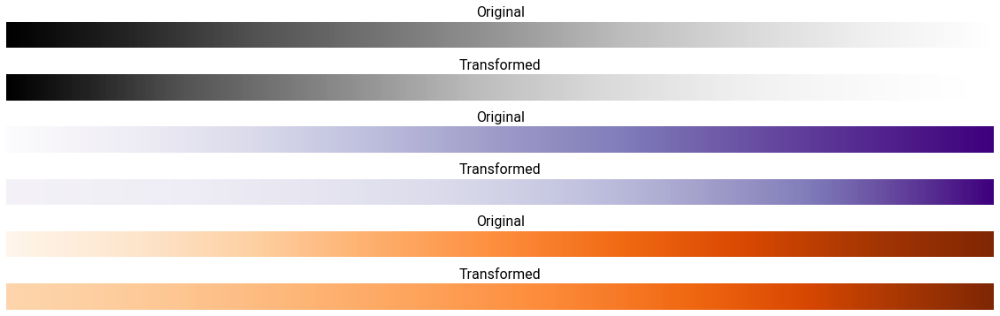

In [20]:
# Create good non-uniform color maps for the data
sim_decay_scale = 1.5
score_decay_scale = 2.5
seq_decay_scale = 1.5

x = np.linspace(0, 1, 256)

transformed = np.power(np.flip(x), sim_decay_scale)
sim_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
    "sim_cmap", plt.get_cmap("Greys")(transformed)
)

transformed = np.exp(score_decay_scale * x) / np.exp(score_decay_scale)
score_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
    "sim_cmap", plt.get_cmap("Purples")(transformed)
)

transformed = np.exp(seq_decay_scale * x) / np.exp(seq_decay_scale)
seq_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
    "sim_cmap", plt.get_cmap("Oranges")(transformed)
)

# Show the color map with the original
fig, ax = plt.subplots(nrows=6, figsize=(20, 6), gridspec_kw={"hspace": 1})
grad = np.linspace(0, 1, 256)
ax[0].imshow(grad[None, :], aspect="auto", cmap="Greys_r")
ax[1].imshow(grad[None, :], aspect="auto", cmap=sim_cmap)
ax[2].imshow(grad[None, :], aspect="auto", cmap="Purples")
ax[3].imshow(grad[None, :], aspect="auto", cmap=score_cmap)
ax[4].imshow(grad[None, :], aspect="auto", cmap="Oranges")
ax[5].imshow(grad[None, :], aspect="auto", cmap=seq_cmap)
for i in range(6):
    ax[i].axis("off")
    if i % 2 == 0:
        ax[i].set_title("Original")
    else:
        ax[i].set_title("Transformed")
plt.show()

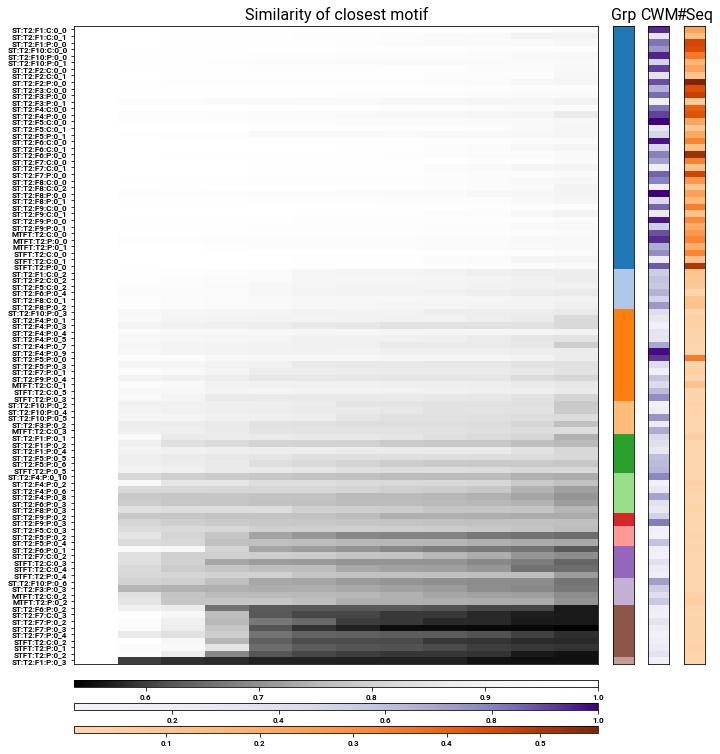

In [21]:
grid_height = max(5, len(motif_keys) * 0.1)
grid_width = max(5, len(cond_inds) * 0.1)
height_spacing, width_spacing = 0.1, 0.1
height = grid_height + 3 + (height_spacing * 3)
width = grid_width + 6 + (width_spacing * 3)

fig, ax = plt.subplots(
    nrows=4, ncols=4, figsize=(width, height),
    gridspec_kw={
        "height_ratios": [grid_height / 0.1, 1, 1, 1],
        "width_ratios": [grid_width / 0.1, 2, 2, 2],
        "hspace": height_spacing,
        "wspace": width_spacing
    }
)

sim_hmap = ax[0, 0].imshow(sorted_cond_sim_matrix, cmap=sim_cmap, aspect="auto")  # auto aspect to stretch
score_hmap = ax[0, 2].imshow(sorted_motif_score_percs[:, None], cmap=score_cmap, aspect="auto")
seq_hmap = ax[0, 3].imshow(sorted_motif_prop_seqlets[:, None], cmap=seq_cmap, aspect="auto")

# Cluster IDs may not be in order, so sort the groups
diffs = np.concatenate([[0], np.diff(cluster_ids)])
diffs[diffs != 0] = 1
sorted_cluster_ids = np.cumsum(diffs)

cmap = cm.get_cmap("tab20")
group_colors = cmap(sorted_cluster_ids[:, None] % 20 / 20)[:, :, :3]
ax[0, 1].imshow(group_colors, aspect="auto")
# we need to first translate into colors instead of specifying `cmap=` to `imshow`,
# otherwise the colors will be different

ax[0, 0].set_yticks(np.arange(len(motif_keys)))
ax[0, 0].set_yticklabels(sorted_motif_keys)
ax[0, 0].set_xticks([])
ax[0, 0].set_title("Similarity of closest motif")
ax[0, 1].set_title("Grp")
ax[0, 2].set_title("CWM")
ax[0, 3].set_title("#Seq")

for i in range(1, 4):
    ax[0, i].set_yticks([])
    ax[0, i].set_xticks([])
    for j in range(1, 4):
        ax[j, i].axis("off")
        ax[j, i].axis("off")
        ax[j, i].axis("off")

fig.colorbar(sim_hmap, cax=ax[1, 0], orientation="horizontal")
fig.colorbar(score_hmap, cax=ax[2, 0], orientation="horizontal")
fig.colorbar(seq_hmap, cax=ax[3, 0], orientation="horizontal")

plt.savefig(
    os.path.join(out_path, "%s_fold_model_motif_reproducibility.svg" % tf_name),
    format="svg"
)
plt.show()

In [22]:
# Show the average similarity of each cluster, and overall
cmap = cm.get_cmap("tab20")

colgroup = vdomh.colgroup(
    vdomh.col(style={"width": "10%"}),
    vdomh.col(style={"width": "10%"}),
    vdomh.col(style={"width": "10%"}),
    vdomh.col(style={"width": "10%"}),
    vdomh.col(style={"width": "10%"})
)
header = vdomh.thead(vdomh.tr(
    vdomh.th("Cluster ID", style={"text-align": "center"}),
    vdomh.th("Cluster color", style={"text-align": "center"}),
    vdomh.th("Number of motifs", style={"text-align": "center"}),
    vdomh.th("Mean similarity", style={"text-align": "center"}),
    vdomh.th("Standard error", style={"text-align": "center"})
))

rows = []
means, stderrs, cluster_sizes = [], [], []
for cluster_id in np.unique(sorted_cluster_ids):
    match_inds = np.where(sorted_cluster_ids == cluster_id)[0]
    
    sims = sorted_cond_sim_matrix[match_inds][:, 1:]  # First column is always 1, so remove it
    
    mean, stderr = np.mean(sims), np.std(sims) / np.sqrt(sims.size)
    cluster_size = len(match_inds)
    means.append(mean)
    stderrs.append(stderr)
    cluster_sizes.append(cluster_size)
        
    group_color = matplotlib.colors.rgb2hex(cmap(cluster_id % 20 / 20))
    fig, ax = plt.subplots(figsize=(0.3, 0.3))
    circle = plt.Circle((0, 0), 10, color=group_color)
    ax.add_patch(circle)
    ax.axis("off")
    plt.axis("scaled")
    
    rows.append(vdomh.tr(
        vdomh.td(str(cluster_id)),
        vdomh.td(figure_to_vdom_image(fig)),
        vdomh.td(str(cluster_size)),
        vdomh.td(str(mean)),
        vdomh.td(str(stderr))
    ))

total_sims = sorted_cond_sim_matrix[:, 1:]
total_mean, total_stderr = np.mean(total_sims), np.std(total_sims) / np.sqrt(total_sims.size)
rows.append(vdomh.tr(
    vdomh.td("All"),
    vdomh.td(""),
    vdomh.td(str(len(total_sims))),
    vdomh.td(str(total_mean)),
    vdomh.td(str(total_stderr))
))

display(vdomh.table(colgroup, header, vdomh.tbody(*rows)))
plt.close("all")

# Save results of clustering
out_hdf5 = os.path.join(out_path, "%s_clusters.h5" % tf_name)
with h5py.File(out_hdf5, "w") as f:
    f.create_dataset("raw_sim_matrix", data=raw_sim_matrix)
    f.create_dataset("sorted_cond_sim_matrix", data=sorted_cond_sim_matrix)
    f.create_dataset("sorted_motif_prop_seqlets", data=sorted_motif_prop_seqlets)
    f.create_dataset("sorted_motif_scores", data=sorted_motif_scores)
    f.create_dataset("sorted_motif_keys", data=sorted_motif_keys)
    f.create_dataset("sorted_cluster_ids", data=sorted_cluster_ids)
    f.create_dataset("cluster_sizes", data=cluster_sizes)
    f.create_dataset("cluster_mean_sims", data=means)
    f.create_dataset("cluster_stderr_sims", data=stderrs)
    f.create_dataset("total_mean_sim", data=total_mean)
    f.create_dataset("total_stderr_sim", data=total_stderr)

Cluster ID,Cluster color,Number of motifs,Mean similarity,Standard error
0,,37,0.9656444201233745,0.0011300586625956725
1,"<img src=""data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAABUAAAAVCAYAAACpF6WWAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAAABS0lEQVR4nLXUsUsbURwH8E%2BMUEgROghHxop/Q7nVxaHbgYXSqQiFDraDSzfRvyCgsyJOgsNR6J/Q4QqF7l2L0IMO1aJEEo1DLnBt3qVJTL7bvcf7vN/v8e7Ver2eWWdh5iIWR02mWV7DGt7iaVHEOY7wKYmjbmhdrar9NMs30MITPEatNP0HHezhIImjv5Agmmb5B%2BygMaoTXOEUb8rw0JmmWf5qTFDRwUvsVlaaZnkdP7E8BlhOG80kjn6HKn2ORxOCcIfXg49/0XdYmgJt4H0VujIFOEizCh15b/%2BTehX66wHoZRV6rH/3Jk1H/74G0ZPA2DjpYj%2BIJnF0iUNcTwC28TmJo%2B9BtMg2vo4J3%2BAHXpQHh9AkjjpYx8eiik4Auy02/YJnSRxdlCcrXylIs3wVW9jU/897xSZnaCVx9C20biQ6beby8s8FvQdn41gtJJTMkwAAAABJRU5ErkJggg%3D%3D"">",6,0.9199839334160962,0.003613512483860384
2,,14,0.88645757339489,0.002514945113043291
3,,5,0.8518495538226776,0.003957356155391427
4,"<img src=""data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAABUAAAAVCAYAAACpF6WWAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAAABRUlEQVR4nLXUsUtbQRwH8E%2BaQiEidOiSUel6q7uLQ%2BcWpMsrguCgHVzcRP%2BCQJ0tfZ0KToJ/gotQ6HBb1yI4OGhESUnadMgTXuu9mKTJd3t33Od%2Bv%2BPe1fr9vmnnydRFPB02GfJQwzI2sFAUcY6POIlZ7KXW1araD3l4jRaeYw610vQNutjHQcziX0gSDXnYwS4awzrBLb5gvQw/ONOQh7cjgooOVrFXWWnIQx0XeDECWE4HzZjFq1Slr/BsTBB%2B4939x7/oFuYnQBt4X4UuTgDep1mFDr23j6RehV7%2BB9quQj8Z3L1x0zW4r0n0c2JslPTwIYnGLLZxiLsxwA5OYxa/J9Ei2/g6IvwTP/CmPPgAjVnsYgXHRRXdBPar2PQMSzGL1%2BXJylcKQh5eYhNrBv95v9jkCK2YxW%2BpdUPRSTOTl38m6B8G5Vxcq/ZewQAAAABJRU5ErkJggg%3D%3D"">",6,0.8370677790251648,0.004800424996758465
5,,6,0.7843801878103207,0.004542235151717445
6,"<img src=""data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAABUAAAAVCAYAAACpF6WWAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAAABRklEQVR4nLXUsUtbQRwH8E%2BMUEgRHFwyVhze/QPuLh2cK0inUhAcWgcXN6l/QaCdW6RTwUnwT3ApFDreo6sIHTq0KYqSaDrkBV6bezFJk%2B/27rjP/X7Hvav1ej2zzsLMRSyOmoxZqGEDu3hSFHGJDzgLeeym1tWq2o9ZeIYWlvEYtdL0b3RwhHchj38hSTRm4QCHaIzqBFf4hJ0yPHSmMQvPxwQVHWzjTWWlMQt1fMfKGGA5N2iGPP5MVbqJRxOCcI8Xg49/0ddYmgJtYK8KXZ0CHKRZhY68tw%2BkXoX%2B%2BA%2B0XYUe69%2B9SdPRv69J9GNibJx08TaJhjy28R7XE4A3OA95/JZEi%2Bzjy5jwLS6wVR4cQkMeO3iK06KKTgK7Kzb9jPWQx1/lycpXCmIW1vAKL/X/816xyQlaIY9fU%2BtGotNmLi//XNA/0Gpb1fng/CwAAAAASUVORK5CYII%3D"">",2,0.7679246676216251,0.0039310343411941215
7,,3,0.7589432958822987,0.008774639755664773
8,,5,0.7488911663752681,0.008416149898038554
9,,4,0.7394772313731454,0.005678185193449749


<h3>Cluster 0 (37 motifs)</h3>

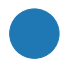

<table><colgroup><col style="width: 10%"></col><col style="width: 90%"></col></colgroup><thead><tr><th style="text-align: center">Motif ID</th><th style="text-align: center">Motif</th></tr></thead><tbody><tr><td>ST:T2:F8:P:0_1</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAACtSUlEQVR4nOzdd3wc1bn/8c/srlZdstx7xTQ7VNNDIPRAKAFCCMkv3DRSbki76SE9kNz05BIgJLRQkhB6Cy300GxjgzEuuHfZVpdW2jq/P54d71rIsna00qp836/XeFfyliNpdubMc57zHMd1XURERERERERERERE8i1Q6AaIiIiIiIiIiIiIyNCkALSIiIiIiIiIiIiI9AkFoEVERERERERERESkTygALSIiIiIiIiIiIiJ9QgFoEREREREREREREekTCkCLiIiIiIiIiIiISJ9QAFpERERERERERERE%2BoQC0CIiIiIiIiIiIiLSJxSAFhEREREREREREZE%2BoQC0iIiIiIiIiIiIiPSJUKEbkIvRo0e706dPL3QzRERERERERERERIathQsX7nRdd0xPHjuoAtDTp09nwYIFhW6GiIiIiIiIiIiIyLDlOM76nj5WJThEREREREREREREpE8oAC0iIiIiIiIiIiIifUIBaBERERERERERERHpEwpAi4iIiIiIiIiIiEifUABaRERERERERERERPqEAtAiIiIiIiIiIiIi0icUgBYRERERERERERGRPqEAtIiIiIiIiIiIiIj0CQWgRURERERERERERKRPKAAtIiIiIiIiIiIiIn1CAWgRERERERERERER6RMKQIuIiIiIiIiIiIhIn1AAWkRERERERERERET6hALQIiIiIiIiIiIiItInFIAWERERERERERERkT6hALSIiIiIiIiIiIiI9AkFoEVERERERERERESkT/Q6AO04znTHcRY5jrPOcZzruvu%2B4zhfdBxnleM4mxzH%2BWD6ey2O46xwHGe54zgn9rY9IiIiIiIiIiIiIjIw5CMD%2BvPAM8C%2BwMWO4%2BzXzfcPBU4DrgYudBxnMlAGtAPrgNfy0B4RERERERERERERGQDyEYAeA9S5rhsDGoHRe/q%2B67ofBxLAJ7Ag9HbgcGAeUApc3PnFHce5zHGcBY7jLNixY0cemisiIiIiIiIiIiIi/SEfAeidwFjHcUJANVC7p%2B87jjMXeAz4vOu6zwOzgC8AScAFYp1f3HXd613Xnee67rwxY8bkobkiIiIiIiIiIiIi0h/yEYC%2BFjgeWAHcDnzJcZxDO3/fdd1VwKPAeOBqx3FeAlZjmc%2BrgRbgn3loj4iIiIiIiIiIiIgMAKHevoDrumuw2s5dObTTYyd38ZiP9LYNIiIiIiIiIiIiIjLw5CMDWkRERERERERERETkHRSAFhEREREREREREZE%2BoQC0iIiIiIiIiIiIiPQJBaBFREREREREREREpE8oAC0iIiIiIiIiIiIifUIBaBERERERERERERHpEwpAi4iIiIiIiIiIiEifUABaRERERERERERERPqEAtAiIiIiIiIiIiIi0idChW6AiIiIiIiI5JHrQnQHxJog1WFfB0ugqApKxoHjFLqFIiIiMowoAC0iIiIiIjKYtW2A2megfj7sfAWal0EqDoEicNKTXl03/b0gVO4Ho4%2BGUUfA2BOgYkZBmy8iIiJDmwLQIiIiIiIig028FTbeDSv/DxrftGBzonX3x6Si73xeCmh4zba15ZBKQtV%2BsO8XYOoHIVzdL80XERGR4UMBaBERERERkcGiZRUs/g5sfhACoUzQuatg894k2uy28XV47cuw4HKYeDoc/DOoPiBvTRYREZHhTQFoERERERGRgS7WAK9fAWtuglQM3KRlM%2BeLF4ze/CBsfQymXQKH/BxKxuTxTURERGQ4ChS6ASIiIiIiIrIHqTgs/y3cNxVW3wjJdgs%2B9xU3BckOWHc73D8d3rzKvhYRERHxSQFoERERERGRgah1HTxyCLz%2BPSu1kerHQHAqCskILL0SHp4DzSv7771FRERkSFEAWkREREREZKDZ/DA8chC0rIBkW%2BHakYxYIPxfh8GGuwrXDhERERm0FIAWEREREREZKFIJeO3r8MIHIdHSt%2BU2eixlQfCXLoX5/21lQURERER6SAFoERERERGRgSARgX%2BfCG9fY7WeB5pkBNbcDI8dDfHmQrdGREREBgkFoEVERERERAot0QZPngh1Cy3QO1AlI9C0FB5/N8SaCt0aERERGQQUgBYRERERESmkeAs88R5oXNK/Cw36lYpaberHj4VYY6FbIyIiIgOcAtAiIiIiIiKFEm%2BGJ99jWcWDIfjsScWgdRU8fgxE6wvdGhERERnAFIAWEREREREphGTUym40LbOs4sEmFYPWNfDEcVZCRERERKQLCkCLiIiIiIj0N9eFlz8BzcsHZ/DZk4pB6zr4z8WFbomIiIgMUApAi4iIiIiI9LcVf4BN90GyvdAt6b1UB2x7qtCtEBERkQEqVOgGiIiIiIiIDCu1T8Pr3x4awWdPMlLoFoiIiMgApQxoERERERGR/tK6Fp49b2gFn0VERES6oQC0iIiIiIhIf0gl4JmzINla6JaIiIiI9BsFoEVERERERPrDWz%2BDtvXgpgrdEhEREZF%2BoxrQIiIiIiIifa1pGSz9mUpviIiIyLCjDGgREREREZG%2BlErCCxdBsqPQLRERERHpdwpAi4iIiIiI9KVlv4LWNYBb6JaIiIiI9LteB6Adx5nuOM4ix3HWOY5zXXffdxzni47jrHIcZ5PjOB90HCfkOM596cc85zhOdW/bIyIiIiIiMmA0vw1v/giSkUK3RERERKQg8pEB/XngGWBf4GLHcfbr5vuHAqcBVwMXpu9PBWYArcDFeWiPiIiIiIjIwDD/c5CKFboVIiIiIgWTjwD0GKDOdd0Y0AiM3tP3Xdf9OJAAPoEFoccA9a7rusD2rOfu4jjOZY7jLHAcZ8GOHTvy0FwREREREZF%2BUPsM7HwJ3GShWyIiIiJSMPkIQO8ExjqOEwKqgdo9fd9xnLnAY8DnXdd9Pv2YMenHj8567i6u617vuu4813XnjRkzpvN/i4iIiIiIDDxuCl79jEpviIiIyLAXysNrXAvcDawAbge%2B5DjOjZ2/77ruKsdxNgHlwNWO4zQA7wE%2B4zjOKmAT8I88tEdERERERKSwNvwT2rf073sWj4Kx74WRh8HoY6FyNgRL7P9SUWhZBTtfhPrXYPsz0LG9f9snIiIiw1KvA9Cu667Bajt35dBOj53cxWPO6W0bREREREREBoxUAl77KiRa%2B/69AkUw8SzY979hzLshGYVQBQSC73xs6QQLTCfaIBiGuldg5R9h0wMWoBYRERHpA/nIgBYRERERERHPmpsh3tz37zP1Ipj3BwiWQlGVfc/LeN6TQBDC6ceOPQFqDoUj4vDaV2DtbYDbp00WERGR4ScfNaBFREREREQErPbzG9/v2%2BznkfPgzNfhqL9AybhM8NmPoior3THvGnj/MhhzXP7aKSIiIoIC0CIiIiIiIvmz%2BaG%2BDT7v/z9wyrNQPReKKvP3ukUVULUfvPcxmPt9wMnfa4uIiMiwpgC0iIiIiIhIvrz5Y0i05P91i6rgxIfhXT%2BEUB

<h3>Cluster 1 (6 motifs)</h3>

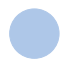

<table><colgroup><col style="width: 10%"></col><col style="width: 90%"></col></colgroup><thead><tr><th style="text-align: center">Motif ID</th><th style="text-align: center">Motif</th></tr></thead><tbody><tr><td>ST:T2:F8:P:0_2</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAACPqklEQVR4nOzddZgj15nv8W%2BVuNU008MMhjHT2GM7ZojjMG/i4GYTb9DJzWYDm2Q3uTdMmw3ThsmOITFz7NhODDPmQQ8zdE%2BTusVV94%2Bjaql7GiS11Gr4fZ6nHqnVqtJpdalU9Z73vMdyXRcRERERERERERERkUqza90AEREREREREREREZmcFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkarw17oBw5kxY4a7ZMmSWjdDRERERERERERERHLWrFnT6rruzGKeO64D0EuWLGH16tW1boaIiIiIiIiIiIiI5FiWtaPY56oEh4iIiIiIiIiIiIhUhQLQIiIiIiIiIiIiIlIVCkCLiIiIiIiIiIiISFUoAC0iIiIiIiIiIiIiVaEAtIiIiIiIiIiIiIhUhQLQIiIiIiIiIiIiIlIVCkCLiIiIiIiIiIiISFUoAC0iIiIiIiIiIiIiVaEAtIiIiIiIiIiIiIhUhQLQIiIiIiIiIiIiIlIVCkCLiIiIiIiIiIiISFUoAC0iIiIiIiIiIiIiVaEAtIiIiIiIiIiIiIhUhQLQIiIiIiIiIiIiIlIVCkCLiIiIiIiIiIiISFUoAC0iIiIiIiIiIiIiVaEAtIiIiIiIiIiIiIhUhQLQIiIiIiIiIiIiIlIVCkCLiIiIiIiIiIiISFUoAC0iIiIiIiIiIiIiVaEAtIiIiIiIiIiIiIhUhQLQIiIiIiIiIiIiIlIVCkCLiIiIiIiIiIiISFUoAC0iIiIiIiIiIiIiVaEAtIiIiIiIiIiIiIhUhQLQIiIiIiIiIiIiIlIVCkCLiIiIiIiIiIiISFUoAC0iIiIiIiIiIiIiVaEAtIiIiIiIiIiIiIhUhQLQIiIiIiIiIiIiIlIVCkCLiIiIiIiIiIiISFUoAC0iIiIiIiIiIiIiVeGvdQNERERERsN1YetWeOopWL0aHn4Ytm2DZBLSaQgEIBSCo46C886DlSvhtNNg8WKwrFq3XkREREREZHJTAFpEREQmpE2b4Mc/hp//HFIp8PshFgPHGfz5e/ea4HR9vQlM19XBe95jlmXLxrbtIiIiIiIiU8WoS3BYlrXEsqynLMvablnWj4p4/DjLsnoty3rraF9bREREppZ0Gn71Kzj1VLN897vQ0QG9vdDVNXTw2eM45nnxOLS1wbe%2BBSecAGedBX/4A2SzY/BHiIiIiIiITCGVqAH9fuAB4BjgTZZlHTvU45ZlBYH/BQ5W4HVFRERkCrnvPjjmGPjgB%2BGZZ0wQOZ0e3TZTKUgk4Ikn4Oqr4fjj4ZFHKtNeERERERERqUwAeibQ5rpuCugAZgzz%2BFeA3wDbh9qYZVlXW5a12rKs1YcOHapA80RERGQi274drrwSXvlKcz8Wq87rxGKmrMeLXwyvfS3s2VOd1xEREREREZlKKhGAbgVmWZblB5qAA0M8ngHeCnwYOAv42mAbc133J67rrnRdd%2BXMmTMr0DwRERGZiFwXvv99k5V8772mzMZY6O2FW2812da//OXYvKaIiIiIiMhkVYkA9A%2BB84GNwO%2BAD1uWddrAx13Xfcx13Vmu664AHgc%2BXoHXFhERkUkokYC3vQ0%2B/nFTaiOTGdvXT6dNIPoDH4D3vnf0pT5ERERERESmKv9oN%2BC67lbgtCF%2BPejjruteNNrXFRERkclp9254yUtg61YTfK6l3l74zW9g9Wq4/XaYNau27REREREREZloKpEBLSIiIlIRTzwBJ50EGzfWPvjs6e2FZ581pUCee67WrREREREREZlYFIAWERGRceHJJ%2BGSS6CjY%2BxLbowknYa2Njj/fFi3rtatERERERERmTgUgBYREZGae%2BYZuPhiiMVq3ZLhdXXBeefBpk21bomIiIiIiMjEoAC0iIiI1NS6dXDhhSa4O965rsnQPvdc2LKl1q0REREREREZ/xSAFhERkZrZutVkFE%2BE4LPHdaG9Hc45B/burXVrRERERERExjcFoEVERKQm4nF4yUugs9MEdScSxzFB6Je%2BtNYtERERERERGd8UgBYREZEx57rwznfC7t0mmDsRZTLwwgu1boWIiIiIiMj45q91A0RERGTq%2BeEP4bbbTBb0RNbbW%2BsWiFRBNgXpLnASprfIF4ZAg7kVERERESmRAtAiIiIyph5/HD72sYkffBaZFNIxOHAfHH4a2h6FjuchsQ%2BsAFjeYEkHnDQEW6D5BGg5G6adCrMvgfCMGjZeRERERCYCBaBFRERkzHR3w8tfruCzSE1lk7DvTtj8M9h/D9ghyPaAm80/p/C%2BJ3kQDhyEAw%2BCPwpOClpWwVFXw4JXQaB%2B7P4GEREREZkwFIAWERGRMfOxj5kgtIjUQLINnv9/sPmnYPkgk/swOskSN%2BTk1z30N2h/Eh77F1j4Ojj1yxBdVNFmi4iIiMjEpkkIRUREZEw8%2Bij85jeQSNS6JSJTTKYHnvs8/HkRvPBjyPbmA8gV2X7MBLF3/gluXQFPfAASrZXbvoiIiIhMaApAi4iISNWl03DVVSq9ITKmXBde%2BCncNB/Wfc0Enp0q9gC5acjGYcv/wl8Ww3P/D5xM9V5PRERERCYEBaBFRESk6r7yFThwoNatEJlCkofhry%2BBJ/8PpDtN8HmsOEnzeuu%2BCneuhJ4dY/faIiIiIjLuKAAtIiIiVbV5M3z5y9A7hvEvkSntwINwyzFw8AEzuWCtZHug83m47UTYcV3t2iEiIiIiNaUAtIiIiFTVBz8IqVStWyEyBbguPPOf8MCVkGoDZxx88NysqRH96D/D398OTrrWLRIRERGRMaYAtIiIiFTNo4/CQw9BNlvrlohMcq4Dj/0LbPimqcM83mR7YdcNpixIZhy2T0RERESqRgFoERERqQrXNdnPKr0hUmVOGh56Hey4dmxrPZcq2wutf4d7L4B0V61bIyIiIiJjxF/rBoiIiMjkdN99sGHD2L3enDlw9tlwxhlw3nnm52DQlP/YuxcefhjWrIF//AMOHRq7dolUVSYOD74MWh8b38FnTzYBHc/BXavgsocgPKPWLRIRERGRKlMAWkRERCrOdeHf/g16qjz/WSAAr3wlXHMNnHmmCTZHo%2BAfcIazYgVccIFpTyhkgtHf%2BQ7ccQdkMtVto0jVOGm4/3JoX2MCuxOFk4TuLXDXWfCqrbVujYiIiIhUmQLQIiIiUnH33gtbtlT3Nd70Jvje90wQurHRPBaJDP18vx%2Bamsz9yy6Ds84y5UHe9z7485%2Br21aRinNdePRd0P7UxAo%2Be9w0xPfWuhUiIiIiMgZUA1pEREQq7rOfrV7280knmVIaP/0ptLTkg8%2Blamw0ZTp%2B8xt45BE49tjKtlOkqtZ%2B

<h3>Cluster 2 (14 motifs)</h3>

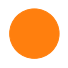

<table><colgroup><col style="width: 10%"></col><col style="width: 90%"></col></colgroup><thead><tr><th style="text-align: center">Motif ID</th><th style="text-align: center">Motif</th></tr></thead><tbody><tr><td>ST:T2:F4:P:0_9</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAABuyElEQVR4nO3dd5xcV3nw8d%2BZtrNdK2lVbVmucgUX2WATAzYl9GJ6C6GEmkASXlJJMGmQEFIICeAAIXRC793YBlOM3KtsWZZt9bpabZ123z/OzM5sk1baouLf9/O52tWd2Ttn2r3nPvc5zwlJkiBJkiRJkiRJ0kxLHe4GSJIkSZIkSZKOTQagJUmSJEmSJEmzwgC0JEmSJEmSJGlWGICWJEmSJEmSJM0KA9CSJEmSJEmSpFlhAFqSJEmSJEmSNCsMQEuSJEmSJEmSZoUBaEmSJEmSJEnSrDAALUmSJEmSJEmaFQagJUmSJEmSJEmzInO4G7A/CxcuTFauXHm4myFJkiRJkiRJqrrxxht3JknSPZX7HtEB6JUrV7JmzZrD3QxJkiRJkiRJUlUI4cGp3tcSHJIkSZIkSZKkWWEAWpIkSZIkSZI0KwxAS5IkSZIkSZJmhQFoSZIkSZIkSdKsMAAtSZIkSZIkSZoVBqAlSZIkSZIkSbPCALQkSZIkSZIkaVZMOwAdQlgZQrg5hLAhhPCRhvXHhRDeG0K4J4RwXHXd20II60IIG0MIL5ruY0uSJEmSJEmSjlwzkQH9FuAa4DTgpSGEVdX184BfA6sAQggBOA94KvAh4IUz8NiSJEmSJEmSpCPUTASgu4FdSZIUgB5gIUCSJHckSfL12p2S6DVACXgtMQg9TgjhDSGENSGENTt27JiB5kmSJEmSJEmSDoeZCEDvBBaFEDJAJ7BtsjuGEM4GfgC8JUmSn010nyRJrkqSZHWSJKu7u7tnoHmSJEmSJEmSpMNhJgLQHwYuBdYCnwXeHkI4b5L7fh9YAnwohPDLGXhsSZIkSZIkSdIRKjPdDSRJsp5Y23my20PD78dN9/EkSZIkSZIkSUeHmciAliRJkiRJkiRpHAPQkiRJkiRJkqRZYQBakiRJkiRJkjQrDEBLkiRJkiRJkmaFAWhJkiRJkiRJ0qwwAC1JkiRJkiRJmhUGoCVJkiRJkiRJs8IAtCRJkiRJkiRpVhiAliRJkiRJkiTNCgPQkiRJkiRJkqRZYQBakiRJkiRJkjQrDEBLkiRJkiRJkmaFAWhJkiRJkiRJ0qwwAC1JkiRJkiRJmhUGoCVJkiRJkiRJs8IAtCRJkiRJkiRpVhiAliRJkiRJkiTNCgPQkiRJkiRJkqRZYQBakiRJkiRJkjQrDEDPhCSB0gAklcPdEkmSJEmSJEk6YhiAno5KCe7/BHxtKXypA77YDDe8BQa3He6WSZIkSZIkSdJhZwD6UJULcM0zYM3bYGgbJGWoFGD9J%2BA7Z0Dv2sPdQkmSJEmSJEk6rAxAH4qkAj%2B7Anb8HMr9o2%2BrDEOhB354CfStPyzNkyRJkiRJkqQjgQHoQ3Hvh2DbT6E8OMkdkhiE/tkLrQstSZIkSZIk6RHLAPTB6n8YbvlzKA8c4I4V2Hcv3PeROWmWJEmSJEmSJB1pDEAfrBveGGs9T0WpH27%2BExjeNbttkiRJkiRJkqQjkAHog9F7H2z/KSSlg/ijCtz7n7PWJEmSJEmSJEk6UhmAPhh3vQ8qBxN8JtaJvudfoDw8O22SJEmSJEmSpCPUtAPQIYSVIYSbQwgbQggfaVh/XAjhvSGEe0IIx1XXvSaE8FAI4b4QwtOm%2B9hzangXPPi5g8x%2BrkrKsOGzM98mSZIkSZIkSTqCzUQG9FuAa4DTgJeGEFZV188Dfg2sarjvPwLPBv4SePcMPPbcufdDQDi0vy31we1/A0kyo02SJEmSJEmSpCPZTASgu4FdSZIUgB5gIUCSJHckSfL1ie4LbK/db6wQwhtCCGtCCGt27NgxA82bAZUi3POvsZzGoSrsgq0/mrk2SZIkSZIkSdIRbiYC0DuBRSGEDNAJbDvQfYnB5wnvlyTJVUmSrE6SZHV3d/cMNG8G7PgFJJXpbaPUDw98ZmbaI0mSJEmSJElHgcwMbOPDwFeAtcBngbeHED6RJMnNE9z3z4EvA0Xg92fgsefGxq9DaWCaG0lg83dmojWSJEmSJEmSdFSYdgA6SZL1wHn7uT00/P4x4GPTfcw59/BXgPL0t1Menv42JEmSJEmSJOkoMRMlOI5tfRtgaIZqUSfFmdmOJEmSJEmSJB0FDEAfyObvQAgHvt9UVAozsx1JkiRJkiRJOgoYgD6QBz8P5cHD3QpJkiRJkiRJOuoYgN6f0gDsWnO4WyFJkiRJkiRJRyUD0Puz7WpINR3uVkiSJEmSJEnSUckA9P489BUo7TvcrZAkSZIkSZKko5IB6P3Z/F0gOdytkCRJkiRJkqSjkgHoyQztgGLP4W6FJEmSJEmSJB21DEBPZtdvIN18uFshSZIkSZIkSUctA9CT2fVrKPUd7lZIkiRJkiRJ0lHLAPRktl0NSflwt0KSJEmSJEmSjloGoCeSJLDn1sPdCkmSJEmSJEk6qhmAnsjAw5CUpn7//CJY/hzoOnfWmiRJkiRJkiRJR5vM4W7AEWnPrZDKQnnwwPc940/gnHdDpQipTJy88NrnQGnf7LdTkiRJkiRJko5gZkBPZM/NUBo48P1OfTOc89eQaYFcJ2RaYcFj4bLvxQC2JEmSJEmSJD2CGYCeyI5fHLgEx%2BLL4Lz3x6Bzo0w%2BluK46L9nrXmSJEmSJEmSdDQwAD2RnilMQHj%2Bv4wPPtdkWmHFi6H1xJltlyRJkiRJkiQdRQxAj1Xqh%2BGd%2B79P929B2yn7v08qDWe/a%2BbaJUmSJEmSJElHGQPQY/XcEWs678%2Bj//7A90nl4ISXQX7xzLVNkiRJkiRJko4iBqDH6l0LSWXy2%2Bc9GuZfAGEKL10IcMY7Z65tkiRJkiRJknQUMQA9Vt/9UBqY/PYz/hhSTVPbVjoPp74JQmZm2iZJkiRJkiRJRxED0GPtvQPYTwb08mdD6iACypUSdD9u2s2SJEmSJEmSpKONAeix9q2b/Lau8w4%2BmznTCsc9b1pNkiRJkiRJkqSjkQHosQYenvy25c%2BKkwsejFQGjr9iem2SJEmSJEmSpKOQAehG5WEo9k5%2B%2B4qXQHqK9Z8bNS2E1hMOvV2SJEmSJEmSdBQyAN2o/0FIN098W9NCaD/5EDecwLJnHnKzJEmSJEmSJOloZAC6Ud8DENIT37b0aVApHNp2M61wwssOvV2SJEmSJEmSdBSadgA6hLAyhHBzCGFDCOEj%2B1sfQnhrCGFjCOHBEMKRVxi5f/3kQeblz4Jsx6Fve8GFkwe3JUmSJEmSJOkYNBMZ0G8BrgFOA14aQli1n/WvBv4U%2BDjw4hl47JnVex%2BUBye%2BbeHF09t2ZRg6z5zeNiRJkiRJkiTpKJKZgW10A/cnSVIIIfQAC4G1k6z/PDH4nAUmzIAOIbwBeAPAihUrZqB5B2HvnROvz7RB85JpbjwF8y%2Bc5jYkSZIkSZIk6egxExnQO4FFIYQM0Als28/6Pwd%2BG/g9Yib0OEmSXJUkyeokSVZ3d3fPQPMOQt/6idfPPx9KA9PbdrYNFj1%2BetuQJEmSJE

<h3>Cluster 3 (5 motifs)</h3>

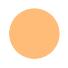

<table><colgroup><col style="width: 10%"></col><col style="width: 90%"></col></colgroup><thead><tr><th style="text-align: center">Motif ID</th><th style="text-align: center">Motif</th></tr></thead><tbody><tr><td>MTFT:T2:C:0_3</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAADLW0lEQVR4nOzddZxc5dn/8c8ZWZfYxl1ICA7BXR%2BkUKxFSoVSaKH6q1JvqTx9KG2pAy1VtECRUtwhwRISQoi7Z91l7Pz%2BuOZkVmZWZ2Y3yff9eu0rcGb2zD2zZ865z3Vf93U7rusiIiIiIiIiIiIiIpJuvsFugIiIiIiIiIiIiIjsnRSAFhEREREREREREZGMUABaRERERERERERERDJCAWgRERERERERERERyQgFoEVEREREREREREQkIxSAFhEREREREREREZGMUABaRERERERERERERDJCAWgRERERERERERERyQgFoEVEREREREREREQkIxSAFhEREREREREREZGMCAx2A7ozatQod%2BrUqYPdDBERERERERERERGJW7RoUaXrumW9ee6QDkBPnTqVhQsXDnYzRERERERERERERCTOcZxNvX2uSnCIiIiIiIiIiIiISEYoAC0iIiIiIiIiIiIiGaEAtIiIiIiIiIiIiIhkhALQIiIiIiIiIiIiIpIRCkCLiIiIiIiIiIiISEYoAC0iIiIiIiIiIiIiGaEAtIiIiIiIiIiIiIhkhALQIiIiIiIiIiIiIpIRCkCLiIiIiIiIiIiISEYoAC0iIiIiIiIiIiIiGaEAtIiIiIiIiIiIiIhkhALQIiIiIiIiIiIiIpIRCkCLiIiIiIiIiIiISEYoAC0iIiIiIiIiIiIiGaEAtIiIiIiIiIiIiIhkhALQIiIiIiIiIiIiIpIRCkCLiIiIiIiIiIiISEYoAC0iIiIiIiIiIiIiGaEAtIiIiIiIiIiIiIhkhALQIiIiIiIiIiIiIpIRCkCLiIiIiIiIiIiISEYoAC0iIiIiIiIiIiIiGaEAtIiIiIiIiIiIiIhkxIAD0I7jTHUcZ7HjOBsdx7mt3faJjuP8r%2BM4Kx3HmRjfdrXjOJsdx1njOM7ZA31tERERERERERERERm60pEBfQPwErAfcLnjOLPj24cBbwKz2z33/4DzgW8D30/Da4uIiIiIiIiIiIjIEJWOAHQZUOW6bgioBUYBuK67zHXdR5I9Fyj3nteZ4zjXOY6z0HGchRUVFWlonoiIiIiIiIiIiIgMhnQEoCuB0Y7jBIBSYFdPz8WCz0mf57ruHa7rznNdd15ZWVkamiciIiIiIiIiIiIigyGQhn38EXgIWAXcDXzRcZy/uK67OMlzvwk8CISBz6XhtUVERERERERERERkiBpwANp13fXAYd087rT77z8Dfx7oa4qIiIiIiIiIiIjI0JeOEhwiIiIiIiIiIiIiIl0oAC0iIiIiIiIiIiIiGZGOGtAiIiIiIiJ7t0gzbLoftjwIkRYYdgDMuh5K5w52y0RERESGNAWgRUREREREurP2Tnjni4ADkUbbVvEqrLsTRh4FJz4EuSMHtYkiIiIiQ5VKcIiIiIiIiCQTi8Lbn4NFX4BIUyL4DOBGINoCFa/Dfw%2BE2vcHr50iIiIiQ5gC0CIiIiIiIsks%2BiKs/ytEm1M/xw1B6y549nho2pK9tomIiIjsIRSAFhERERER6WzD3T0Hn3dzLTv6xbMh2prxpomIiIjsSRSAFhERERERaa9%2BFbx1XS%2BDz3FuFJo2wNs3ZK5dIiIiInsgBaBFREREREQ8rgtvfgpi/chkjrbApvug%2Bp30t0tERERkD6UAtIiIiIiIiGfb41C9GNxY/34/2gpvfNIC2SIiIiKiALSIiIiIiAgAsTC89WmINg1gJy40rrVMaBERERFRAFpERERERASATfdDpGHg%2B4k0wZJvKgtaREREBAWgRURERERELFj83vch0pie/YWqYMfT6dmXiIiIyB5MAWgREREREZFdz0PrrvTtL9JoAW0RERGRfZwC0CIiIiIiIu/9wEpnpFPtsvTuT0RERGQPpAC0iIiIiIjs21p2QNXC9O831pb%2BfYqIiIjsYRSAFhERERGRfdum%2B8HJwK2RG03/PkVERET2MApAi4iIiIjIvm3t7RBtGexWiIiIiOyVFIAWEREREZF9V8M6aNo42K0QERER2WspAC0iIiIiIvuuDXeB6w52K0RERET2WoHBboCIiIiISF/EYvDaa/DKK9DWBtOnw0UXwbBhg90y2eO4Lqz/sxYLFBEREckgBaBFREREZI9xzz3wpS9BSws0N1swurAQrr/egtC33w4lJYPdStlj1L4HbTWD3QoRERGRvZpKcIiIiIjIkNfSAh/5CFx7LVRUQGOjBZ8BmposE/rhh2HOHFi0aHDbKnuQbY%2BDGx7sVoiIiIjs1RSAFhEREZEhLRKBD3wA/v1vy3pOpa0NduyAU06Bd9/NWvNkT7btUYiFBrsVIiIiIns1BaBFREREZMhyXbjmGnjjDWht7d3vNDbCaafB5s2ZbZvs4aJtULNksFshIiIistdTAFpEREREhqy//AUeeqj7zOdk6urg3HMhGs1Mu2QvUPUm%2BPMGuxUiIiIiez0FoEVERERkSKqogP/3/6zGc19Fo7BxI/zhD2lvluwtdjwLkT6ObIiIiIhInykALSIiIiJD0mc/a3Wd%2B6upCb75Tdi%2BPX1tkr3ItsfAjfT99wqnwrCDwZ%2Bf9iaJiIiI7I0UgBYRERGRIeeFF%2BC//4XQANeHC4XguuvS0ybZi0RDUL%2Byb78z6jg4dxmc9z6c8QpcXA6H3QJOIDNtFBEREdlLDDgA7TjOVMdxFjuOs9FxnNu62%2B44zmcdx9nqOM4mx3EuHuhri4iIiMjeJxKBj32s73WfkwmH4cUX4ZlnBr4v2YvULAZfH%2Bo/T7wITnsWhh0AgQLIKYVgEcz6jG33F2SurSIiIiJ7uHRkQN8AvATsB1zuOM7sbrZ/HPgGcCfw4TS8toiIiIjsZZ54Aurr07e/5ma46ab07U/2ApULINbL%2Bi6TLoHj7rLAc2eBQhh5NJw5Hxx/etsoIiIispdIRwC6DKhyXTcE1AKjutl%2BLxZ8/n78v7twHOc6x3EWOo6zsKKiIg3NExEREZE9yS23QENDeve5aFF69yd7uB1P9y4AHSiGo/%2BUPPi8%2Bzn5UDwTZt2QvvaJiIiI7EXSEYCuBEY7jhMASoFd3Wz/JvA/wLVYJnQXruve4bruPNd155WVlaWheSIiIiKyp9iwAd5%2BO/37jcXSv8/B0toKL78Mjz8Ob7xhJUukD1wXKt/s3XMPvgl8uT0/L1gEh/wEckcOrG0iIiIie6F0BKD/CJwIrALuBr7oOM5hnbe7rrsWuCP%2BnB8Af0/Da4uIiIjIXuQPf8hMsHigixkOBevXw8UXw4gRcMEFcNVVcNZZ9v/XXQfV1YPdwj1E85beZT8Xz4KZ13Wf/dyeLwiH/XxgbRMRERHZCzmu6w52G1KaN2%2Beu3DhwsFuhoiIiIhkQSgEZWXprf/c3hDu9nbLdeG22%2BCrX4W2NohGuz4nJwcKC%2BGuu%2BDcc7Pfxj3KtsdhwUcg3MOBdvqLUHYC%2BAK933ekGZ45DmrfTWy7cg898ERERES64Tj

<h3>Cluster 4 (6 motifs)</h3>

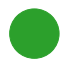

<table><colgroup><col style="width: 10%"></col><col style="width: 90%"></col></colgroup><thead><tr><th style="text-align: center">Motif ID</th><th style="text-align: center">Motif</th></tr></thead><tbody><tr><td>STFT:T2:P:0_5</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAADcYklEQVR4nOzdd3xb1dkH8N/VlnecYWc7e5BAJmHvvQphQ6GFtrTQRfvSAZRCacvoooUWKLSllL1H2CSQhIQQsve2HTuJdzxlWfO%2BfzySta5kybry4vf9fATxlXR1ZEv3nvuc5zxHUVUVRERERERERERERER6M/R2A4iIiIiIiIiIiIhoYGIAmoiIiIiIiIiIiIgyggFoIiIiIiIiIiIiIsoIBqCJiIiIiIiIiIiIKCMYgCYiIiIiIiIiIiKijGAAmoiIiIiIiIiIiIgyggFoIiIiIiIiIiIiIsoIBqCJiIiIiIiIiIiIKCMYgCYiIiIiIiIiIiKijGAAmoiIiIiIiIiIiIgywtTbDQgaMmSIWlJS0tvNICIiIiIiIiIiIqIE1q1bV6%2Bq6tBkHttnAtAlJSVYu3ZtbzeDiIiIiIiIiIiIiBJQFGV/so9lCQ4iIiIiIiIiIiIiyggGoImIiIiIiIiIiIgoIxiAJiIiIiIiIiIiIqKMYACaiIiIiIiIiIiIiDKCAWgiIiIiIiIiIiIiyggGoImIiIiIiIiIiIgoIxiAJiIiIiIiIiIiIqKMYACaiIiIiIiIiIiIiDKCAWgiIiIiIiIiIiIiyggGoImIiIiIiIiIiIgoIxiAJiIiIiIiIiIiIqKMYACaiIiIiIiIiIiIiDKCAWgiIiIiIiIiIiIiyggGoImIiIiIiIiIiIgoIxiAJiIiIiIiIiIiIqKMSCkArShKiaIoGxRFKVcU5fEktk9TFKVdUZSv69loIiIiIiIiIiIiIur7Us2AvgXAUgCTAVylKMqUeNsVRbEA%2BDeAWn2aSkRERERERERERET9SaoB6KEAGlRVdQNoAjAkwfYHADwDoDzezhRFuUlRlLWKoqytq6tLsSlERERERERERERE1JeZUnx8PYBhiqKYAOQDqImz3Qvg6wAOAxgDyYx%2BNnpnqqo%2BAeAJAJg3b57anTdARERERERERERERH1TqhnQjwE4EcAuAM8B%2BLGiKLOjt6uqulpV1WGqqk4F8CWAn%2BvYZiIiIiIiIiIiIiLqB1LKgFZVtRTA7Dh3a25XVfWUFNtERERERERERERERANAqhnQRERERERERERERERJYQCaiIiIiIiIiIiIiDKCAWgiIiIiIiIiIiIiyggGoImIiIiIiIiIiIgoIxiAJiIiIiIiIiIiIqKMYACaiIiIiIiIiIiIiDKCAWgiIiIiIiIiIiIiyggGoImIiIiIiIiIiIgoIxiAJiIiIiIiIiIiIqKMYACaiIiIiIiIiIiIiDKCAWgiIiIiIiKiTPG2A44KwNPW2y0hIiLqFabebgARERERERHRgNNWCmz%2BNVDxKqAYAdUHjLwAOPK3QP603m4dERFRj2EAmoiIiIiIiEhPtSuApedJ9jN8oe0H3gAOfQCc%2BBow4uxeax4REVFPYgkOIiIiIiIiIr3UrgA%2BPRvwtiIi%2BAwAqh/wOYDPLgEOvd8rzSMiIuppDEATERERERER6aGjHlj%2BNcDXnvhxPiew4iqg/UDPtIuIiKgXMQBNREREREREpIeVVwGe1uQe62sHll8MqGpGm0RERNTbGIAmIiIiIiIiSlfNp0D9KkD1JPd41Qu07AQOvJnRZhEREfU2BqCJiIiIiIiI0qGqwNofd116I5rXAaz/CeD3df1YIiKifooBaCIiIiIiIqJ0HHoXcJR277muemD/i/q2h4iIqA9hAJqIiIiIiIiou1Q/sO5WyWbuDq8D2HAb4E%2BydAcREVE/wwA0ERERERERUXdVLwE6atLbh7cNqHxDn/YQERH1MQxAExEREREREXVX6VPdz34O8rYB%2B/6tT3uIiIj6GAagiYiIiIiIiLrD5wYOvAVATX9ftcvS3wcREVEfxAA0ERERERERUXdULwYUoz77Mpj12Q8REVEfwwA0ERERERERUXeUPgV4W/XZl7dNn/0QERH1MQxAExEREREREaXK1wEceq%2B3W0FERNTnMQBNRERERERElKqqD/Urv0FERDSAMQBNRERERERElCo9y28QERENYAxAExEREREREaXC1yEZ0ERERNQlBqCJiIiIiIiIUtGwBlAsvd0KIiKifoEBaCIiIiIiIqJU1CwFfM7ebgUREVG/wAA0ERERERERUSoOvQuont5uBRERUb/AADQRERERERFRsvxeoHFTb7eCiIio32AAmoiIiIiIiChZjRsBg7m3W0FERNRvMABNRERERERElKz6VcmX3xj1NeD8HcBVHuCifcDYqzPbNiIioj6IAWgiIiIiIiKiZNV8Avg6un7c1J8Axz0H5E8FDCYgZzyw4Elg5r2ZbyMREVEfYurtBhARERERERH1G/Wru37MxO8BR/4WMGVHbjdlA9N%2BCvg7gG33ZaZ9meb3AdUfAQfeBLwOYPDRQMm1gHVwb7eMiIj6KAagiYiIiIiIiJLhbgTcDYkfYy4AZv8hNvgcZMoGjrgTKH0KcFbp3sSMalgLLLsI8LYB3lbZVvkGsOHnwIw7gSN%2BBShK77aRiIj6HJbgICIiIiIiIkpGw1rAaEv8mJl3A0oXuV6KEZj1gH7t6gnlLwCLTwI6qkLBZwDwtQN%2BF7DtQWDpeYA/yfrYRET0lcEANBEREREREVEyGr4EvO3x788aA0y8CTDZE%2B/HaAVGXwbkTdO3fZlSuxxY/S3A54z/GJ9DHvfFtwFV7bm2ERFRn8cANBEREREREVEyDq8DVG/8%2B2c9IAsOJsNgAeY%2BpE%2B7MslRCSy9MHHwOcjXDlS%2BCuz%2Be%2BbbRURE/UZKAWhFUUoURdmgKEq5oiiPJ9quKMoDiqKUBm4X6d1wIiIiIiIioh7VvD3%2BfUY7MPpiCSwnw2AChp0MWAp1aVrGrLlZAsvJ8rUDG3/Z/%2BpbExFRxqSaAX0LgKUAJgO4SlGUKQm2bwIwB8CzAK7So7FEREREREREvUJVgfaK%2BPePOD/1%2Bsd%2BLzD6kvTalUnVnwA1nybO%2Btbi9wBrf5iZNhERUb%2BTagB6KIAGVVXdAJoADIm3XVXVFwA8B%2BBXkCB0DEVRblIUZa2iKGvr6uq60XwiIiIiIiKiHuCqA1R//PsnfAsw56W2T3MOMOE76bUrU/yeQN3nFLKfg1QPcOg9oG6l/u0iIqJ%2BJ9UAdD2AYYqimADkA6iJs71FUZQHAFwP4LuQIHQMVVWfUFV1nqqq84YOHdqtN0BERERERESUcS27AaNN%2Bz5TNlB0Svf2O%2BgowNoHr4f3PC5B9%2B7yOYEvbuSChERElHIA%2BjEAJwLYBclu/rGiKLOjt6uqugWABVKG4/bA/URERERERET9U%2Buu%2BKUoRl4I%2BN3d26/fC4y%2BtPvtygRVBbb/AfA60tuP8yDQsFqfNhERUb%2BV5PK8QlXVUgCz49w9O%2BqxPwXw0262i4iIiIiIiKjvaNoePyA7/pupl98IMucAE24E9j7e7abprv4LwNOU/n58TmD3P4A

<h3>Cluster 5 (6 motifs)</h3>

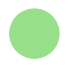

<table><colgroup><col style="width: 10%"></col><col style="width: 90%"></col></colgroup><thead><tr><th style="text-align: center">Motif ID</th><th style="text-align: center">Motif</th></tr></thead><tbody><tr><td>ST:T2:F8:P:0_3</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAADTOUlEQVR4nOzdd3xb9fX/8dfVsC3PLGcnZJKwV4Cy9yob2kJpC12Ulu5N168tdNE9v7TQQgdQdtkbwobsBOJA9o4T20m8l8b9/XGk2Els68qWLNl5Px8P4SBfXX1sS1f3ns/5nOO4rouIiIiIiIiIiIiISLr5sj0AERERERERERERERmcFIAWERERERERERERkYxQAFpEREREREREREREMkIBaBERERERERERERHJCAWgRURERERERERERCQjFIAWERERERERERERkYxQAFpEREREREREREREMkIBaBERERERERERERHJCAWgRURERERERERERCQjFIAWERERERERERERkYwIZHsAPRkxYoQ7adKkbA9DREREREREREREROIWLFhQ47puuZdtczoAPWnSJObPn5/tYYiIiIiIiIiIiIhInOM4671uqxIcIiIiIiIiIiIiIpIRCkCLiIiIiIiIiIiISEYoAC0iIiIiIiIiIiIiGaEAtIiIiIiIiIiIiIhkhALQIiIiIiIiIiIiIpIRCkCLiIiIiIiIiIiISEYoAC0iIiIiIiIiIiIiGaEAtIiIiIiIiIiIiIhkhALQIiIiIiIiIiIiIpIRCkCLiIiIiIiIiIiISEYoAC0iIiIiIiIiIiIiGaEAtIiIiIiIiIiIiIhkhALQIiIiIiIiIiIiIpIRCkCLiIiIiIiIiIiISEYoAC0iIiIiIiIiIiIiGZFSANpxnEmO4yxyHGed4zh/7el%2Bx3G%2B5DjOKsdxNjmO80HHcQKO4zwc3%2BYVx3HK0v3DiIiIiIiIiIiIiEjuSDUD%2BnrgJWB/4ErHcWb0cP8RwNnAn4EPxP89EZgMNAJX9nHsIiIiIiIiIiIiIpLDUg1AlwPbXddtB2qBEd3d77ruJ4AI8EksCF0O7HBd1wWqOj12N47jfMZxnPmO48yvrq5OcXgiIiIiIiIiIiIikitSDUDXACMdxwkAZcC27u53HOdg4Bngetd1X41vUx7ffkSnx%2B7Gdd1bXded5brurPLy8q42EREREREREREREZEBINUA9C3AScBy4C7gy47jHLHn/a7rrgKeBkYDf3Yc503gWWC94zirgGLg3vT8CCIiIiIiIiIiIiKSiwKpbOy67hqstnNXjthj2/FdbHNRKs8nIiIiIiIiIiIiIgNXqhnQIiIiIiIiIiIiIiKeKAAtIiIiIiIiIiIiIhmhALSIiIiIiIiIiIiIZIQC0CIiIiIiIiIiIiKSEQpAi4iIiIiIiIiIiEhGKAAtIiIiIiIiIiIiIhmhALSIiIiIiIiIiIiIZIQC0CIiIiIiIiIiIiKSEQpAi4iIiIiIiIiIiEhGKAAtIiIiIiIiIiIiIhkRyPYAREREREREequpCRoaIBqFwkIYMgQcJ9ujEhEREZEEBaBFRERERGTAqKuDp5%2BGZ56B55%2BHykoIBi3oHIlAXh4cdxxccAGccw7MmJHtEYuIiIjs2xzXdbM9hm7NmjXLnT9/fraHISIiIiIiWbZzJ/zqV/DHP4LPZ1nPPQmF7OuJJ8LNN8MRR2R%2BjCIiIiL7CsdxFriuO8vLtqoBLSIiIiIiOSsSgR/%2BEMaPh9//vqPkRjItLXZ74QU44QQ480zYsCHjwxURERGRPSgALSIiIiIiOWnzZjj2WPj1r6G52QLKqYrF7HEvvQQHHwyPP572YYqIiIhIDxSAFhERERGRnPPss3DQQfD22xZ87qto1DKnP/Qh%2BMpXIBzu%2Bz5FREREJDkFoEVEREREJKf85z9wySXWcDASSe%2B%2BW1rgttvg/PMVhBYRERHpDwpAi4iIiIhIzrjvPrjuut6V2/CquRlefx0uuyz9AW4RERER2Z0C0CIiIiIikhMeeQQ%2B/vHMBp8TmpvhxRfhiiusPIeIiIiIZIYC0CIiIiIiknWvvw4f/nD/BJ8Tmpvh6afh%2Buv77zlFRERE9jUKQIuIiIiISFZVV8PFF/dv8DmhuRnuvBPuvbf/n1tERERkX6AAtIiIiIiIZE0sZrWYGxqyN4bmZvjUp2DlyuyNQURERGSwUgBaRERERESy5ic/gYULob09u%2BNoaYHzz89OFraIiIjIYKYAtIiIiIjIIDLs5mE8UPFAtofhydy58ItfWAZytsVisGkTfPWr2R6JiIiIyOCiALSIiIiIyCBR31bPztadLN62ONtDSSoahauvzq2M45YW%2BNe/sj0KERERkcFFAWgRERERkUGioqoCgHdr3s3ySJK75RbLOM41bW3ZHoGIiIjI4KIAtIiIiIjIIFFRbQHoZdXLsjySnlVVwXe%2BA01N2R7J3lw32yMQERERGVwUgBYRERERGSQWVi4EYEPdhiyPpGdf%2BlL2mw6KiIiISP9QAFpEREREZJCYv2U%2BAM3hZqqaqrI8mq69/TY8%2BqgC0CIiIiL7CgWgRUREREQGiRXbVwDgd/y76kHnmu98R3WWRURERPYlCkCLiIiIiAwCO1p20BJuwcEBOupB55KKCpg9G2KxbI9ERERERPqLAtAiIiIiIoNARVUFoWAIgKgbZd6WeVke0d6%2B%2B12V3hARERHZ1ygALSIiIiIyCCytWkp7tCO6u6hyURZHs7f33oNnn4VoNNsjEREREZH%2BpAC0iIiIiMggsKByAS2Rll3/v3rnalzXzeKIdvfDH0I4nO1RiIiIiEh/UwBaRERERGQQWLBlwW7/H3NjVDZWZmk0u6upgUcfVfaziIiIyL5IAWgRERERkQHOdV1W7li52335/nwqqnKjEeFtt4HjZHsUIiIiIpINCkCLiIiIiAxwVU1VRGKR3e5rjbSytGpplkbUIRaD3/8eWlqSbtorI0fC0UfD%2B94HM2Yo0C0iIiKSawLZHoCIiIiIiPRNRXUF%2BYF82qJtu%2B5ri7Yxb8u8LI7KvPBC%2BoPPkyfDt78N558PI0ZAa6vd7/dbAPrNN%2BEPf4Annkjv84qIiIhI6hSAFhEREREZ4CqqKmiPtu91/6Kti7Iwmt394Q/Q0JCefY0eDb/7HVx8MQQCEAza/QUFu2931lmWEb1lC3z%2B8xYEFxEREZHsUAkOEREREZEBbt6WebRGWve6f%2B3Otbium4URmR074Pnn07Ov00%2BHZcvgsssgFOoIPnenpMRKcjz6KPzyl5YdLSIiIiL9TxnQIiIiIiID3KLKrjOd/Y6fjfUbmVg2sZ9HZB5%2B2ALFbW1JN%2B3R178ON94IhYWpP7awEK6/Hk46yTKjGxv7NpaMcV1o3gQ75kPNW9C0DiLN4MuDghEw/FgYNgvKDgSfLuNERERk4EjpzMVxnEnA/4ChwNOu6362u/sdxzkL%2BASQ57ruB%2BLbNQBbABf4rOu6L6XnxxARERER2Te5rsvqnau7/F7AH2Bp1dKsBaBvv73vAd%2BvfAV%2B/OPeBZ8TiorgsMOsFMepp2auIWKvNK6DFX%2BBNf%2BASIsFnCONQGz37dbeBY4PYm0w5myY%2BXUYeYq6LoqI

<h3>Cluster 6 (2 motifs)</h3>

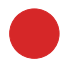

<table><colgroup><col style="width: 10%"></col><col style="width: 90%"></col></colgroup><thead><tr><th style="text-align: center">Motif ID</th><th style="text-align: center">Motif</th></tr></thead><tbody><tr><td>ST:T2:F9:P:0_2</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAADlpElEQVR4nOzddZwc9f3H8desnN/l4m5EcQLB3V2KFWiBGm4tLaXU6K8CpS2lBVq0SKFIkeJO0CAhxJUIcbnLJTmXlfn98d3Lyc7srczeXS7vJ499cJmdnfnu3u3uzGc%2B38/Hsm0bERERERERERERERGv%2Bbp6ACIiIiIiIiIiIiLSMykALSIiIiIiIiIiIiJZoQC0iIiIiIiIiIiIiGSFAtAiIiIiIiIiIiIikhUKQIuIiIiIiIiIiIhIVigALSIiIiIiIiIiIiJZoQC0iIiIiIiIiIiIiGSFAtAiIiIiIiIiIiIikhUKQIuIiIiIiIiIiIhIVigALSIiIiIiIiIiIiJZoQC0iIiIiIiIiIiIiGRFINMNWJY1Cvgf0Bt4w7bty92WW5b1R%2BDc2EN/aNv2S5ZlVQPrABu43Lbt99321a9fP3vUqFGZDllERERERERERERE0vTll19usm27fzLrZhyABq4E3gduBMosy7rDtu3FTsuB2cAfgeuB8yzLmgEUAPXABmBGoh2NGjWK6dOnezBkEREREREREREREUmHZVkrk13XixIc/YEK27abgK1AP7fltm0/CfwH%2BCXwOFAG7ANMBvKB89pv3LKsSy3Lmm5Z1vTy8nIPhisiIiIiIiIiIiIincGLAPQmYIBlWQGgF7DRZXlVrATHRcBlmCD0GOBqIIIpwdHUfuO2bd9v2/Zk27Yn9%2B%2BfVFa3iIiIiIiIiIiIiHQDXgSg7wEOBRZjspuvsyxrUvvltm3PBXIwZThuit2/DJP5vAyoBp7xYDwiIiIiIiIiIiIi0g1Ytm139RiSNnnyZFs1oEVERERERERERES6jmVZX9q2PTmZdb3IgBYRERERERERERERiaMAtIiIiIiIiIiIiIhkhQLQIiIiIiIiIiIiIpIVCkCLiIiIiIiIiIiISFYoAC0iIiIiIiIiIiIiWaEAtIiIiIiIiIiIiIhkhQLQIiIiIiIiIiIiIpIVCkCLiIiIiIiIiIiISFYoAC0iIiIiIiIiIiIiWaEAtIiIiIiIiIiIiIhkhQLQIiIiIiIiIiIiIpIVCkCLiIiIiIiIiIiISFYoAC0iIiIiIiIiIiIiWaEAtIiIiIiIiIiIiIhkhQLQIiIiIiIiIiIiIpIVCkCLiIiIiIiIiIiISFYoAC0iIiIiIiIiIiIiWaEAtIiIiIiIiIiIiIhkhQLQIiIiIiIiIiIiIpIVCkCLiIiIiIiIiIiISFYoAC0iIiIiIiIiIiIiWaEAtIiIiIiIiIiIiIhkhQLQIiIiIiIiIiIiIpIVCkCLiIiIiIiIiIiISFZkHIC2LGuUZVkzLctaYVnWvYmWW5b1R8uylsdup1mWFbAs64XYOh9altUr0/GIiIiIiIiIiIiISPfgRQb0lcD7wHjgPMuyJiRYPhvYG3gcOA84DhgBjAZqYstEREREREREREREpAfwIgDdH6iwbbsJ2Ar0c1tu2/aTwH%2BAX2KC0P2BzbZt20BZq8duY1nWpZZlTbcsa3p5ebkHwxURERERERERERGRzuBFAHoTMMCyrADQC9josrzKsqw/AhcBl2GC0JswQWgwweeNtGPb9v22bU%2B2bXty//79298tIiIiIiIiIiIiIt1UwINt3AM8ByzGZDdfZ1nWQ%2B2X27Y917KsHEwZjibgZuAt4DLLspYCa4CnPRhP92FHYeMU2DoXrCAMPhZKJnT8OBEREREREREREZEewDLVL7YPkydPtqdPn97Vw0jOymdg%2BtUQqYNoE1g%2BwIJeu8JBT0DJuK4eoYiIiIiIiIiIiEjKLMv60rbtycms60UJDmnNjsKX18Nn34HGMgjXmAB0pAEi9bB5BryxN6x9ratHKiIiIiIiIiIiIpJVCkB7beaNsPQ%2Bk/nsKGqC0h%2BfDWUfd%2BrQRERERERERERERDqTAtBe%2BvoJWPLPBMHnViL18MEpULMi68MSERERERERERER6QoKQHulbh1MuyS54HOzcA1MPRe2ozrcIiIiIiIiIiIiIslSANorX14H0VBqj7EjULkA1vwvO2MSERERERERERER6UIKQHth02ew7lWwUwxAA4RrYdoVpkmhiIiIiIiIiIiISA%2BiAHSm7Ch89n1T0zld4RpY8CfvxiQiIiIiIiIiIiLSDSgAnanVz0Pdqsy2EamDBbdB01ZPhiQiIiIiIiIiIiLSHSgAnalFfzMZzJmyLFj5VObbEREREREREREREekmFIDORN1a2Dzdm22Fa2HxXd5sS0RERERERERERKQbUAA6E1//22Que6X2a%2B%2B2JSIiIiIiIiIiItLFFIBOl23DV/%2BASIN324yGvduWiIiIiIiIiIiISBdTADpdFZ9DaKu327RD3m5PREREREREREREpAsFunoA260l90KkvqtHISIiIiKSlA0b4IEHYPZsKC2Fb30LjjjC24pyIiIiIiLtKQCdjnA9rHoG7GhXj0REREREJKFoFG64Af75T/PvhlgFuaefhiFD4LXXYMyYrhufiIiIiPRsCkCnY91rYPm7ehTdQ6QBNn8JoWrI7Qe9J4FPr42IiIhId1BfD9/4Bnz0UUvguVlNDSxdCnvvDa%2B/Dgcd1DVjFBEREZGeTQHodKx5AcLVXT2KrlW5CGZcDxungD8XsExGuB2B4WfBpNsgf3BXj1JERERkh2XbcPHF8MEH8cHnZtEoVFXBCSeY0hyjR3fuGEVERESk51MTwlTZNqx/s6tH0XXsKMz8GbyxN2x4E6KNEKqCUKUJykfqYOVT8NJYWPpgV49WREREZId1333w6qvuwefW6urgxBOTW1dEREREJBUKQKeqZhmEa7p6FF0j0gAfnA5f3WUaMLrVwLZDJhD95XUw48cmaC8iIiIinWbVKrj%2BehNYTkYkYh7z619nd1wiIiIisuNRADpVG94Gum%2Br8MpK%2BPxz%2BOQTWLvWww3bNnzyLdj4rgkuJyNSB0vuhXm/83AgIiIiItKRG26AUCi1x9TXw913w/r12RmTiIiIiOyYFIBO1eoXkw/AAvSZDDvfAOOuzFpN5GgUnnoKJk6EAQPguOPgpJNg7FgYOBB%2B8xvTZCYjC/4I6940mc%2BpiNSZx655OcMBiIiIiEgy5s6Fl1%2BGcDj1x0YicNNN3o9JRERERHZclr0dlUeYPHmyPX369K4bgG3Ds6Wm5nFHAkVw2AvQd3/w5YAdBsuCub%2BDBbe6P%2B6C1H4fH3wAP/iByVSprXVep6AAgkH4wx/gyivNMFKy7g346MzUg8%2BtBQrh%2BGnQa5f0tyEiIiIiHTrqKHOMGHWpltaR/HyYNQvGj/d0WCIiIiLSg1iW9aVt25OTWVcZ0KmoWQbRJFJJ8gbBCV9Cv4MgWAT%2BHAgUgD8fdv057P8QXpTxeOkl0yxm6VL34DOY2n%2BVlXDjjXDddSmWZA7XwdQLMgs%2Bb9vOeZltQ0REREQS%2BugjU44t3eAzQFMT/PCHng1JRERERHZwGQegLcsa

<h3>Cluster 7 (3 motifs)</h3>

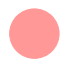

<table><colgroup><col style="width: 10%"></col><col style="width: 90%"></col></colgroup><thead><tr><th style="text-align: center">Motif ID</th><th style="text-align: center">Motif</th></tr></thead><tbody><tr><td>ST:T2:F5:P:0_4</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAACXP0lEQVR4nOzdd5wkVbn/8U9V58mzEzfnACwsS84oIkEFFfEa8YqKIj8UM95rAkVU1KvXDAoXAyZUJIvknHdhYXfZyOadnGOHqt8fp3t6QvXEnrT7fb9e/ZqZ6p7q07HOeeo5z7Fc10VEREREREREREREJNvsyW6AiIiIiIiIiIiIiByYFIAWERERERERERERkXGhALSIiIiIiIiIiIiIjAsFoEVERERERERERERkXCgALSIiIiIiIiIiIiLjQgFoERERERERERERERkXCkCLiIiIiIiIiIiIyLhQAFpERERERERERERExoUC0CIiIiIiIiIiIiIyLhSAFhEREREREREREZFx4Z/sBqSUlpa6CxYsmOxmiIiIiIiIiIiIiMggXnzxxTrXdcuGc9spE4BesGABL7zwwmQ3Q0REREREREREREQGYVnWzuHeViU4RERERERERERERGRcKAAtIiIiIiIiIiIiIuNCAWgRERERERERERERGRcKQIuIiIiIiIiIiIjIuFAAWkRERERERERERETGhQLQIiIiIiIiIiIiIjIuFIAWERERERERERERkXGhALSIiIiIiIiIiIiIjAsFoEVERERERERERERkXCgALSIiIiIiIiIiIiLjQgFoERERERERERERERkXCkCLiIiIiIiIiIiIyLhQAFpERERERERERERExoUC0CIiIiIiIiIiIiIyLhSAFhEREREREREREZFxoQC0iIiIiIiIiIiIiIwLBaBFREREREREREREZFwoAC0iIiIiIiIiIiIi40IBaBEREREREREREREZFwpAi4iIiIiIiIiIiMi4UABaRERERERERERERMaFAtAiIiIiIiIiIiIiMi4UgBYRERERERERERGRcTGiALRlWQssy1prWdYOy7J%2BNYzth1iW1WFZ1gez2WgRERERERERERERmfpGmgF9GfAIsAx4r2VZyzNttywrCNwI1GSnqSIiIiIiIiIiIiIynYw0AF0G1LuuGwWagNJBtn8X%2BD2wI9POLMv6uGVZL1iW9UJtbe0ImyIiIiIiIiIiIiIiU5l/hLevA8oty/IDhUB1hu1x4INAAzAPkxn9h/47c133BuAGgGOOOcYdzQMQERERERERERERkalppBnQvwROBTYBtwBXWJa1uv9213WfdV233HXdFcBzwJey2GYRERERERERERERmQZGlAHtuu52YHWGqz23u677hhG2SUREREREREREREQOACPNgBYRERERERERERERGRYFoEVERERERERERERkXCgALSIiIiIiIiIiIiLjYkQ1oMVDVw3s%2BBPUPAq4UHoSLPgA5Mya7JaJiIiIiIiIiIiITCoFoEcrEYW1X4CtN4BlQ6LTbN9/H6z7mglCH/Mz8Ecmt50iIiIiIiIiIiIik0QlOEajswruPRK23QhOdzr4DOZ3pxt2/gnuPgzad05aM0VEREREREREREQmkwLQIxVrgQdOg9YtkOjIfLtEJ3TsgvtPha66iWufiIiIiIiIiIiIyBShAPRIOAl46Gxo3wVufOjbuwnorIYHzzAlO0REREREREREREQOIgpAj8Tmn0DTOlNiY7jcKLRtg/XXjl%2B7RERERERERERERKYgBaCHq303vPzVwctuZJLogI3XQcvm7LdLREREREREREREZIpSAHo4XBee%2BTA4Yyij4XTDUx80%2BxIRERERERERERE5CCgAPRx7boO6Z4dX9zkT14HmDbD9puy1S0RERERERERERGQKUwB6KK4La6%2BERPvY95Voh5e/Nvb9iIiIiIiIiIiIiEwDCkAPpf5Z6Nyfvf3FW7O3LxEREREREREREZEpTAHooWz8ISQ6s7e/eFv29iUiIiIiIiIiIiIyhSkAPZjueth7F%2BBMdktEREREREREREREph0FoAez7Saw9BSJiIiIiIiIiIiIjIaiq5m4Drz2I0h0THZLRERERERERERERKYlBaAzqXpQCwaKiIiIiIiIiIiIjIEC0Jm89j9aMFBERERERERERERkDBSA9pLohupHJrsVIiIiIiIiIiIiItOaAtBeah4DOzjZrRARERERERERERGZ1hSA9rLnNpXfEBERERERERERERkjBaC97L4NcCa7FSIiIiIiIiIiIiLTmn%2ByGzDltG6DWPPI/qfkWJh5NmBD1QNQ99S4NE1ERERERERERERkOlEAur/qhwBreLcNFsNpt0Hx0eALm/875AvQ8ho8%2BjboqhnPloqIiIiIiIiIiIhMaSrB0d/eOyDRMfTt8pfBW9dDyfEQyAPbD7YPAvlQtMpcV3TE%2BLdXREREREREREREZIpSALo314Wax4a%2BneWH0%2B%2BAUEUy87kfXxBCpXD6Xd7Xi4iIiIiIiIiIiBwEFIDurWUjuImhb3fYf0NkNthDPH2hElh1bXbaJiIiIiIiIiIiIjLNKADdW82j4DqD36bwMDj0SlN2Yyj%2BHFjyCbNIoYiIiIiIiIiIiMhBRgHo3mqfgkTn4Lc56RawQ8Pfpy8MJ/1pbO0SERERERERERERmYYUgO6t/vnBry85FvIWm8UGh8uyIVwOFWeMrW0iIiIiIiIiIiIi04wC0ClOAtpfH/w2Kz43ukUF/blwyBdG1y4RERERERERERGRaUoB6JS2rWAHM18fLIY5bwfbP/J9WzZUvAEiM0fdPBEREREREREREZHpRgHolKZ1DPp0LPrw0AsUDsYFllw6%2Bv8XERERERERERERmWYUgE5pWAPxtszXr/i8KaUxWv4ILLscrBHUjxYRERERERERERGZxhSATql9CsiQ4Vx8JAQKx34ftg/KTh77fkRERERERERERESmAQWgU5pfzXzd7PPADoz9Pny5MPsdY9%2BPiIiIiIiIiIiIyDSgADRAtBHirZmvn/ce8IXGfj%2B2H%2Ba9a%2Bz7EREREREREREREZkGFIAGaFwHvhzv64IzIH9J9u4rVJa9fYmIiIiIiIiIiIhMYSMKQFuWtcCyrLWWZe2wLOtXg223LOu7lmVtT17Oz3bDs6rpZUh0e19XfjokurJ3X248e/uaDG3bYduN8NqPYccfoat2slskIiIiIiIiIiIiU5R/hLe/DHgEuBKosSzrR67rbvLaDrwMfBf4HPBe4I4stTn7ml4BJ0OQeeY54M/P3n0FsriviVT1EDz3CejcC9jgxsAOgROFkmPhuF9D4YrJbqWIiIiIiIiIiIhMISMtwVEG1LuuGwWagNJM213X/RNwC/BV4A9eO7Ms6%2BOWZb1gWdYLtbWTmEnbujXzdbPOAfsgrlSSiMKT74dHz4O2rZDohES7CTzHW8Hphtqn4F9HwfrvgOtOdotFRERERERERERkihhpZLUOKLcsyw8UAtUZtrdYlvVd4EPAJzBB6AFc173Bdd1jXNc9pqxsEmsjd%2Bz23u7Pg0jlxLZlKol3wMNnwZ5/QqJjkBs6JjD96jWw5nMKQouIiIiIiIiIiAgw8gD0L4FTgU2Y7OYrLMta3X%2B767qv

<h3>Cluster 8 (5 motifs)</h3>

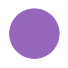

<table><colgroup><col style="width: 10%"></col><col style="width: 90%"></col></colgroup><thead><tr><th style="text-align: center">Motif ID</th><th style="text-align: center">Motif</th></tr></thead><tbody><tr><td>STFT:T2:C:0_3</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAAC/eklEQVR4nOzddXxcZfbH8c8diUys7rSlghYpFCnu7u6L68I6y2%2BVFdhd2F1Y3BcWt%2BLuFCjSUgoU6i6ppXEbub8/zgxJG5mbZCaZpN83r3mlJDdzn9id557nPOc4rusiIiIiIiIiIiIiIpJqvq4egIiIiIiIiIiIiIj0TApAi4iIiIiIiIiIiEhaKAAtIiIiIiIiIiIiImmhALSIiIiIiIiIiIiIpIUC0CIiIiIiIiIiIiKSFgpAi4iIiIiIiIiIiEhaKAAtIiIiIiIiIiIiImmhALSIiIiIiIiIiIiIpIUC0CIiIiIiIiIiIiKSFgpAi4iIiIiIiIiIiEhaBLp6AK3p16%2BfO3LkyK4ehoiIiIiIiIiIiIjETZs2ba3ruv29HJvRAeiRI0cyderUrh6GiIiIiIiIiIiIiMQ5jrPY67EqwSEiIiIiIiIiIiIiaaEAtIiIiIiIiIiIiIikhQLQIiIiIiIiIiIiIpIWCkCLiIiIiIiIiIiISFooAC0iIiIiIiIiIiIiaaEAtIiIiIiIiIiIiIikhQLQIiIiIiIiIiIiIpIWCkCLiIiIiIiIiIiISFooAC0iIiIiIiIiIiIiaaEAtIiIiIiIiIiIiIikhQLQIiIiIiIiIiIiIpIWCkCLiIiIiIiIiIiISFooAC0iIiIiIiIiIiIiaaEAtIiIiIiIiIiIiIikhQLQIiIiIiIiIiIiIpIWCkCLiIiIiIiIiIiISFooAC0iIiIiIiIiIiIiaaEAtIiIiIiIiIiIiIikhQLQIiIiIiIiIiIiIpIWCkCLiIiIiIiIiIiISFp0OADtOM5Ix3GmO46zyHGcu1p7v%2BM4Qx3HecFxnO8cx8nq6LlFREREREREREREJHOlIgP6cuB9YAvgNMdxtmzl/f8FtgP8wAEpOLeIiIiIiIiIiIiIZKhUBKD7A%2Btc160HSoF%2Brbx/X%2BA04D/An5t7MsdxLnYcZ6rjOFPXrFmTguGJiIiIiIiIiIiISFdIRQB6LTDAcZwAUASsauX9pUAWUAPUNfdkruve47ruBNd1J/Tv3z8FwxMRERERERERERGRrhBIwXPcCTwLzAYeBX7iOM4DG7/fdd15juP8FHgQCz5floJzi4iIiIiIiIiIiEiG6nAA2nXdBcD4Fj48fqNjHwce7%2Bg5RURERERERERERCTzpaIEh4iIiIiIiIiIiIhIEwpAi4iIiIiIiIiIiEhaKAAtIiIiIiIiIiIiImmhALSIiIiIiIiIiIiIpIUC0CIiIiIiIiIiIiKSFoGuHoCIiIiI9DBuDGqKIVIJjh%2By%2B0BW764elYiIiIiIdAEFoEVERESk42rXwrLnYdkLsPoDcCMWfAaI1UPOIBh6JAw5CgYfCj5/lw5XREREREQ6hwLQIiIiItJ%2B4Ur4/kb4/p%2BAA9Gq5o%2BrXgJz74aFj0B2X9j5Fhh6FDhOpw5XREREREQ6lwLQIiIiItI%2BCx%2BGqVdCLAzRag%2BfEINIhT0%2BOR0KxsKeT0LhFmkfqoiIiIiIdA01IRQRERGRtolF4PPL4PNLIVzmMfi8kUgVrJ8Br%2B8MK15L/RhFRERERCQjKAAtIiIiIt7VlcDb%2B8LC/7Uv8LwB1xoVTj4Rvr0eXDclQxQRERERkcyhEhwiIiIi4k24HN7cHaoWW2PBVInWwMzrLZt6/D9S97wiIiIiItLllAEtIiIiIslF6%2BDdg6FqSWqDzz88fxXMuQ1m35L65xYRERERkS6jALSIiIiItC4WhcknQek3EKtL33mi1fDVNbD4qfSdQ0REREREOpUC0CIiIiLSuq%2BugVXvWqmMdIvWwKfnQcm09J9LRERERETSTgFoEREREWnZ6skw9/YUNBxsg2g1fHg8RDrxnCIiIiIikhYKQIuIiIhI8%2BrLrPRGZ2Q%2Bb6xuLUz7aeefV0REREREUkoBaBERERFp3mcXQbi8a84drYFFj8KK17vm/CIiIiIikhIKQIuIiIhIU8tfgRWvQKy268YQrYZPzuy684uIiIiISIcpAC0iIiIiG4qF4fNLO7fuc0u6ovyHiIiIiIikjALQIiIiIrKhOXdCeH1Xj8IoAC0iIiIi0q0pAC0iIiIiDepL4evfQaSqq0ciIiIiIiI9gALQIiIiItLg6z%2BCG%2B7qUYiIiIiISA8R6OoBiIiIiEiGqFkF8%2B7p2saDIiIiIiLSoygDWkRERETMrJu6egQiIiIiItLDdDgA7TjOSMdxpjuOs8hxnLtae7/jOLc5jlPsOM4sx3H%2B09Fzi4iIiEiKRKpg7u3KfhYRERERkZRKRQb05cD7wBbAaY7jbNnK%2B7cCygAXeCkF5xYRERGRVJj/ALhuV49CRERERER6mFQEoPsD61zXrQdKgX6tvP9yYA/gn8Cfm3syx3EudhxnquM4U9esWZOC4YmIiIhIq2IR%2BPavEK3q6pGIiIiIiEgPk4oA9FpggOM4AaAIWNXK%2B38CjACiQH1zT%2Ba67j2u605wXXdC//79UzA8EREREWnVshcgWtPVoxARERERkR4okILnuBN4FpgNPAr8xHGcBzZ%2Bv%2Bu68xzH%2BQR4GqgGLkvBuUVERESko2b9GyIVXT0KERERERHpgTocgHZddwEwvoUPj9/o2EexILWIiIiIZIKqJVDyZVePQkREREREeqhUZECLiIiISHc1/wGsP3SKFW4JOQOtvnTFXKhTbw8RERERkU2RAtAiIiIimyrXhfn3QKwuNc9XNA62%2BwMMOgQcH7hRe78/F2qWw8JH4Pt/qtyHiIiIiMgmJBVNCEVERESkO1r3OYTLO/482X1hzyfh0M9g2AmQVQTBAsjqZQ9/NuSPgq1/Cccvgy1%2B3PFzioiIiIhIt6AAtIiIiMimasEDEK3t2HP02g6O%2BBaGHQuBEPj8LR8bCEGwEHb8G%2BzzPPhDHTu3iIiIiIhkPAWgRURERDZFrgtLnm0ok9EeA/aDQ6ZAzgDLcvYqkA%2BDDobDpllAWkREREREeiwFoEVEREQ2RaUzINaB7OfCrWHfFyGQZ/We2yoQgvyRsN%2Br4KgtiYiIiIhIT6UAtIiIiMimaMkkiNa373NzBsJB74E/r2Nj8OdA7x1h9wc79jwiIiIiIpKxFIAWERER2RQtfhzccNs/z58LB7wDWb3Bl4KpZCAPNjsWxv2%2B488lIiIiIiIZRwFoERERkU1N1VKoXta%2Bz93hr5C/OfiyUjeeQD5sc41lQ4uIiIiISI%2BiALSIiIjIpmb5S%2B2r25w3EsZcavWbU82XA7vcnfrnFRERERGRLqUAtIiIiMimZvGTEK1u%2B%2Bft/J/0NQz0%2BaBoGxh6VHqeX0REREREuoQC0CIiIiKbklgUSr5o%2B%2Bf12x0GHQj%2BFJbe2FgwH3a5M31BbhERERER6XQKQIuIiIhsSsq%2BBcff9s/b9W5rQJhuwV4w9tL0n0dERERERDqFAtAiIiIim5LVk8GNtu1zh

<h3>Cluster 9 (4 motifs)</h3>

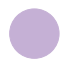

<table><colgroup><col style="width: 10%"></col><col style="width: 90%"></col></colgroup><thead><tr><th style="text-align: center">Motif ID</th><th style="text-align: center">Motif</th></tr></thead><tbody><tr><td>MTFT:T2:P:0_2</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAADTq0lEQVR4nOzdeXxU5fXH8c%2BdmewhYQs7AoILiiKKu7hW61JtrdVaW/e61LprtdpFu6pdbH9WrbVatdaqdV8AN1BAUVlEEET2HQTClj2Z5f7%2BOIkJkOXezExmJnzfr9e8kkzu3HmSTObee57znOO4rouIiIiIiIiIiIiISKIFUj0AEREREREREREREemcFIAWERERERERERERkaRQAFpEREREREREREREkkIBaBERERERERERERFJCgWgRURERERERERERCQpFIAWERERERERERERkaRQAFpEREREREREREREkkIBaBERERERERERERFJCgWgRURERERERERERCQpFIAWERERERERERERkaRQAFpEREREREREREREkiIU7w4cxxkMvAR0A95wXffKlu53HOdu4Jz6h17vuu6rjuOUA2sBF7jSdd33Wnqunj17uoMHD453yCIiIiIiIiIiIiLSTjNnzix1XbfEy7ZxB6CBq4D3gFuBDY7j/MV13QXN3Q/MBu4GbgTOdRznEyAfqAa%2BBD5p7YkGDx7MjBkzEjBkEREREREREREREWkPx3FWeN02ESU4SoBNruvWAVuBni3d77ru08BTwM%2BB/wAbgIOA0UAecO6OO3cc53LHcWY4jjNj48aNCRiuiIiIiIiIiIiIiHSERASgS4FejuOEgGJgfQv3l9WX4LgAuAILQg8FrgaiWAmOuh137rruw67rjnZdd3RJiaesbhERERERERERERFJA4kIQP8dGAMswLKbr3McZ9SO97uu%2BxmQjZXhuK3%2B%2B0uwzOclQDnwXALGIyIiIiIiIiIiIiJpwHFdN9Vj8Gz06NGuakCLiIiIiIiIiIiIpI7jODNd1x3tZdtEZECLiIiIiIiIiIiIiOxEAWgRERERERERERERSQoFoEVEREREREREREQkKRSAFhEREREREREREZGkUABaRERERERERERERJJCAWgRERERERERERERSQoFoEVEREREREREREQkKRSAFhEREREREREREZGkUABaRERERERERERERJJCAWgRERERERERERERSQoFoEVEREREREREREQkKRSAFhEREREREREREZGkUABaRERERERERERERJJCAWgRERERERERERERSQoFoEVEREREREREREQkKRSAFhEREREREREREZGkUABaRERERERERERERJJCAWgRERERERERERERSQoFoEVEREREREREREQkKRSAFhEREREREREREZGkUABaRERERERERERERJJCAWgRERERERERERERSQoFoEVEREREREREREQkKeIOQDuOM9hxnFmO4yx3HOeh1u53HOdux3GW1t/OcBwn5DjOy/XbTHYcpzje8YiIiIiIiIiIiIhIekhEBvRVwHvAnsC5juPs1cr9s4EDgf8A5wInAbsBQ4CK%2BvtEREREREREREREpBNIRAC6BNjkum4dsBXo2dL9rus%2BDTwF/BwLQpcAm13XdYENTR77FcdxLnccZ4bjODM2btyYgOGKiIiIiIiIiIiISEdIRAC6FOjlOE4IKAbWt3B/meM4dwMXAFdgQehSLAgNFnxezw5c133Ydd3RruuOLikp2fHbIiIiIiIiIiIiIpKmEhGA/jswBliAZTdf5zjOqB3vd133MyAbK8NxW/333wJWOI6zGCgEnk3AeEREREREREREREQkDThW/SIzjB492p0xY0aqhyEiIru4ujqYMcNu27bZ1/n5MGAAHHUUDB4MjpPqUYqIiIiIiIgkh%2BM4M13XHe1l21CyByMiItIZVFbCP/8JTzwBn38OubkWeK6tBdeFYNCC0JGIfe/oo%2BHGG%2B2jiIiIiIiIyK5KAWgREZFWbN0K990Hf/oTxGIWiAYLPjcVjUJ5uX1eXQ2vvALvvAPDhsFdd8HJJysrWkRERERERHY9iagBLSIi0ik9%2BywMHAh3323B5Ybgs1eVlTB7Npx9NhxyCKxalZxxioiIiIiIiKQrBaBFRER2UFkJ558Pl1wCFRWW0Rzv/j79FPbdF156KSFDFBEREREREckICkCLiIg08cUXsM8%2B8MILUFWVuP1GIpZF/YMfwA9/aF%2BLiIiIiIiIdHaqAS0iIlLv88/hyCNh2zZrLJgMVVXw9NOwaRM89xyEdCQWERERERGRTkwZ0CIiIsDcuckPPjeoqoK33oKzzlImtIiIiIiIiHRuCkCLiMgub%2B5cOOqojgk%2BN6iqgnfegTPPhHC4Y55TREREREREpKMpAC0iIru00lI47riODT43qKqCiRPhhhs69nlFREREREREOooC0CIissuKRuGMM6CsLHVjqKqCxx6DZ55J3RhEREREREREkkUBaBER2WXdeivMng11dakdR1UVXHopzJuX2nGIiIiIiIiIJJoC0CIiskt65RX4%2B98t%2BJsOqqvh5JNTm40tIiIiIiIikmgKQIuIyC6ntBQuuCB9gs9g9ac3boTrr0/1SEREREREREQSRwFoERHZ5Vx9NdTWpnoUO6utVS1oERERERER6VwUgBYRkV3Ke%2B/Ba6%2BlZwAarBSHiIiIiIiISGehALSIiOwyamrgBz9Ir9IbIiIiIiIiIp2ZAtAiIrLL%2BN3vYMuWVI9CREREREREZNehALSIiOwSSkvh3nuV/SwiIiIiIiLSkRSAFhGRXcLvfgfRaKpHISIiIiIiIrJrUQBaREQ6vfXr4R//SN/GgyIiIiIiIiKdlQLQIiLS6f361xCLpXoUIiIiIiIiIrseBaBFRKRTW7sWHntM2c8iIiIiIiIiqaAAtIiIdGp/%2BINqP4uIiIiIiIikSijVAxAREUmWykp45BGoq0v1SEREREQ6huvCqlUwYwasWwc1NRAKQZcusP/%2BsN9%2BkJOT6lGKiMiuJO4AtOM4g4GXgG7AG67rXtnS/Y7jXAtcC%2BQCN7iu%2B5zjOOXAWsAFrnRd9714xyQiIgLw5JOpHoGIiA/RGgiXQbQWgjmQVQTB3FSPSkQyQG0tvPCCNV2eNQsiEcjKskn4aBQCAQtCBwIWkB48GM48E666CgYNSvXoRUSks3Nc141vB47zByALuBXYABzquu6C5u4Hfgr8BjgHGAXcBKwAPgO%2BBM5xXbespecaPXq0O2PGjLjGKyIiuwbXhd13h%2BXLE7/v7Gw4%2BGA4%2BmjYd1/7essWmDoVpkyBpUvj23%2Bch2YRyRSVK2D1a7BhEmyaBtVrIRDCquS5EAtDXl/ocSj0Ohr6nw6Fg1M8aBFJJ6tXw1//Cg8/bOcPFRXeH5uTA44Dhx0GP/0pnHSSfS0iIuKF4zgzXdcd7WXbRJTgKAGWuK5b5zjOVqAnsKC5%2B13XvdhxnN2AS4BLscD0QcBcYAJwLvDwDj/M5cDlALvttlsChisiIruCqVNh48bE7rN3b7tAu/xyCIchN3f7Jazf%2B55lFq1fDz/7GfzvfxCLJXYMIpLhYlFYOw7m/8mCzo4D0erG70cj229ftcpua1%

<h3>Cluster 10 (8 motifs)</h3>

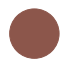

<table><colgroup><col style="width: 10%"></col><col style="width: 90%"></col></colgroup><thead><tr><th style="text-align: center">Motif ID</th><th style="text-align: center">Motif</th></tr></thead><tbody><tr><td>ST:T2:F7:P:0_4</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAADsl0lEQVR4nOzdd3hUZfbA8e%2Bdkh5CJ/SugII06SgWLIu997Y27L2srr3rb227VuyCig0E6QgqINKrdAgdQkudlCn398dJpKTdm8xkZpLzeZ55ApM7d94J4ZbznvccwzRNlFJKKaWUUkoppZRSSqlgc4R7AEoppZRSSimllFJKKaVqJg1AK6WUUkoppZRSSimllAoJDUArpZRSSimllFJKKaWUCgkNQCullFJKKaWUUkoppZQKCQ1AK6WUUkoppZRSSimllAoJDUArpZRSSimllFJKKaWUCgkNQCullFJKKaWUUkoppZQKCQ1AK6WUUkoppZRSSimllAoJDUArpZRSSimllFJKKaWUCgkNQCullFJKKaWUUkoppZQKCVe4B1BVDRs2NNu0aRPuYSillFJKKaWUUkoppVStsHDhwr2maTaysm3UB6DbtGnDggULwj0MpZRSSimllFJKKaWUqhUMw9hsdVstwaGUUkoppZRSSimllFIqJDQArZRSSimllFJKKaWUUiokNACtlFJKKaWUUkoppZRSKiQ0AK2UUkoppZRSSimllFIqJDQArZRSSimllFJKKaWUUiokNACtlFJKKaWUUkoppZRSKiQ0AK2UUkoppZRSSimllFIqJDQArZRSSimllFJKKaWUUiokNACtlFJKKaWUUkoppZRSKiQ0AK2UUkoppZRSSimllFIqJDQArZRSSimllFJKKaWUUiokNACtlFJKKaWUUkoppZRSKiQ0AK2UUkoppZRSSimllFIqJDQArZRSSimllFJKKaWUUiokNACtlFJKKaWUUkoppZRSKiQ0AK2UUkoppZRSSimllFIqJDQArZRSSimllFJKKaWUUiokNACtlFJKKaWUUkoppZRSKiQ0AK2UUkoppZRSSimllFIqJDQArZRSSimllFJKKaWUUiokNACtlFJKKaWUUkoppZRSKiSqHIA2DKONYRiLDcNIMwzjvfKeNwxjqGEYowzD%2BO6Q7bINw1hjGMZqwzCGGIbRq%2BjPmwzDeKyq41NKKaWUUkoppZRSSikVHsHIgL4NmAkcBVxmGMbR5TyfDGwF6gIYhtECSADygDRgEfAw8C7QF3jGMIyEIIxRKaWUUkoppZRSSimlVDULRgC6EbDPNM1CIANoWNbzpmn%2BAKw65LXpQC%2BgNxAPXHbI69KLxlfvyDc0DONmwzAWGIaxYM%2BePUH4CEoppZRSSimllFJKKaWCLRgB6L1AY8MwXEAKsLuC5w/VHrgD8AMmUHjI6xoWPb/vyBeZpvmBaZq9TdPs3ahRoyB8BKWUUkoppZRSSimllFLBFowA9LvAYGANMBK42zCMHkc%2Bb5rm%2BlJeuwHJfN4AZAPfAq8ANwHzgMdN08wPwhiVUkoppZRSSimllFJKVTPDNM1wj6FKevfubS5YsCDcw1BKKaWUUkoppZRSSqlawTCMhaZp9raybTAyoJVSSimllFJKKaWUUkqpEjQArZRSSimllFJKKaWUUiokNACtlFJKKaWUUkoppZRSKiQ0AK2UUkoppZRSSimllFIqJFzhHoBSSimllFK1XSAAK1fC7NkwdSqsWwd5eeByQZ06MGAADBkiXxs1CvdolVJKKaWUsk4D0EoppZRSSoXJ7t3wf/8H77wDhiGBaI%2Bn5HYLFsDHH0N%2BPnToAM88A%2BedB05ntQ9ZKaWUUkopW7QEh1JKKaWUUtVs61a47jpo0wbeegtycyEnp/TgM0hgOisLCgvhr7/kta1awYcfgt9fjQNXSimllFLKJg1AK6WUUkopVY2%2B/BI6d4aRIyWjuaDA/j5ycmDHDrj3XujXD7ZsCf44lVJKKaWUCgYNQCullFJKKVUNMjKkbMYtt0jGs89X9X3m5sLixXDMMTBqVNX3p5RSSimlVLBpAFoppZRSSqkQ27QJunSBSZPKLrNRWX6/ZETfdBMMHw6mGdz9K6WUUkopVRUagFZKKaWUUiqE1q6F44%2BXhoOVKbdhlccDn38u9aEDgdC9j1JKKaWUUnZoAFoppZRSSqkQWblSajTv3189QWGPB777Di69NDglPpRSSimllKoqDUArpZRSSikVAuvXw8CBUvu5OstieDwwYQJcfrmW41BKKaWUUuGnAWillFJKKaWCLDsbhg6Vr%2BEIAns8MHEivPJK9b%2B3UkoppZRSh9IAtFJKKaWUUkEUCMDFF8POneGtxZybC08/DVOnhm8MSimllFJKaQBaKaWUUkqpIHr6aZg1K7QNB63Ky4MLL4SNG8M9EqWUUkopVVtpAFoppZRSSqkgmTkTXntNso8jRW4unHlmuEehlFJKKaVqKw1AK6WUUkopFQQeD1xxhXyNJIEAbN8e7lEopZRSSqnaSgPQSimllFJKBcGjj0JGRrhHUbpIyshWSimllFK1iwaglVJKKaWUqqKFC%2BHDD6XmslJKKaWUUuogDUArpZRSSilVBT4fXHaZBp%2BVUkoppZQqjQaglVJKKaWUqoJPPoGdO8M9CqWUUkoppSKTBqCVUkoppZSqpPx8eOQRrbGslFJKKaVUWVxV3YFhGG2AH4F6wCTTNG8t63nDMIYC1wMxpmleZBhGHeALoCewCxgGnAB8DOwADpim2b%2BqY1RKKaWU%2BlvAB5l/wf75kD4LMpeDLw8wwRkPKcdA48HQ4Hj5s8Md7hGrCPbf/0JBQbhHoZRSSimlVOSqcgAauA2YCTwMpBuG8bppmmtKex5IBrYCvYpe2xlYa5rmuYZhrC56vhNQnEPyYxDGp5RSSikFORthzVuw4SP5u2mCv5S01QOLYOv3YDjB9EO76%2BDou6HOUdU6XBX5srPhmWc0%2B1kppZRSSqnyBCMA3QjYYJpmoWEYGUBDYE1pz5um%2BUNR1nMvANM0/wT%2BNAzjeiAHmAEsAkYBBrDGMIy3TdM8rKWLYRg3AzcDtGrVKggfQSmllFI11v7FsPAe2D8PAn4wvRW/xu85%2BOf1H8LGj6Fud%2Bj1BjTsG6KBqmjz6qvSgFAppZRSSilVtmDUgN4LNDYMwwWkALsreP4whmHcB/wTGGqaZj5wITAQ8AM%2BIHDka0zT/MA0zd6mafZu1KhRED6CUkoppWocXy4suBOmDoQ9v4E/31rw%2BUimV167by5MPwnm3QLe7OCPV0WVnBz4z38gL6/ibZVSSimllKrNghGAfhcYjGQ9jwTuNgyjx5HPm6a5/sgXGoZxKvB/QAvgD8MwHgJmAw8Ck4EHTdPUqnpKKaWUsmfXLzC2nZTb8AcxQujPg02fw9i2sGNS8Paros7HH4d7BEoppZRSSkUHwzTNcI%2BhSnr37m0uWLAg3MNQSimlVKRY%2Bw4sfiC4gefSOOPhuOeh072hfR8Vcfx%2BaNECdu0K90jsifLLfqWUUkopFUEMw1hommZvK9sGowa0UkoppVT4mQFYdC%2BsHxH64DPIeyx9HLJWQ%2B93wOEM/XuqiDBxYmgaD8bEwIABMGgQnHQS1K0rNaY3bIBp0%

<h3>Cluster 11 (1 motifs)</h3>

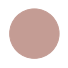

<table><colgroup><col style="width: 10%"></col><col style="width: 90%"></col></colgroup><thead><tr><th style="text-align: center">Motif ID</th><th style="text-align: center">Motif</th></tr></thead><tbody><tr><td>ST:T2:F1:P:0_3</td><td><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAAEAAElEQVR4nOyddZgcVdbG32oZt2RmMnF3d4NAIEJwd2cXdrFlcVgWWXZZFmcXW1w%2BnOCSkECEuLsnE5uZjLu31PfH6d6Z6brVXdV9q2eSnN/zzANpqarurrp173vOeY%2BiqioYhmEYhmEYhmEYhmEYhmEYRja21j4AhmEYhmEYhmEYhmEYhmEY5tiEBWiGYRiGYRiGYRiGYRiGYRjGEliAZhiGYRiGYRiGYRiGYRiGYSyBBWiGYRiGYRiGYRiGYRiGYRjGEliAZhiGYRiGYRiGYRiGYRiGYSyBBWiGYRiGYRiGYRiGYRiGYRjGEliAZhiGYRiGYRiGYRiGYRiGYSyBBWiGYRiGYRiGYRiGYRiGYRjGEliAZhiGYRiGYRiGYRiGYRiGYSyBBWiGYRiGYRiGYRiGYRiGYRjGEhytfQBmyMjIUHv27Nnah8EwDMMwDMMwDMMwDMMwDHPcsm7dumJVVTONvPaoEqB79uyJtWvXtvZhMAzDMAzDMAzDMAzDMAzDHLcoinLQ6GvZgoNhGIZhGIZhGIZhGIZhGIaxBBagGYZhGIZhGIZhGIZhGIZhGEtgAZphGIZhGIZhGIZhGIZhGIaxBBagGYZhGIZhGIZhGIZhGIZhGEtgAZphGIZhGIZhGIZhGIZhGIaxBBagGYZhGIZhGIZhGIZhGIZhGEtgAZphGIZhGIZhGIZhGIZhGIaxBBagGYZhGIZhGIZhGIZhGIZhGEtgAZphGIZhGIZhGIZhGIZhGIaxBBagGYZhGIZhGIZhGIZhGIZhGEtgAZphGIZhGIZhGIZhGIZhGIaxBBagGYZhGIZhGIZhGIZhGIZhGEtgAZphGIZhGIZhGIZhGIZhGIaxBBagGYZhGIZhGIZhGIZhGIZhGEtgAZphGIZhGIZhGIZhGIZhGIaxBBagGYZhGIZhGIZhGIZhGIZhGEtgAZphGIZhGIZhGIZhGIZhGIaxBBagGYZhGIZhGIZhGIZhGIZhGEtgAZphGIZhGIZhGIZhGIZhGIaxBBagGYZhGIZhGIZhGIZhGIZhGEtgAZphGIZhGIZhGIZhGIZhGIaxBBagGYZhGIZhGIZhGIZhGIZhGEtgAZphGIZhGIZhGIZhGIZhGIaxBBagGYZhGIZhGIZhGIZhGIZhGEuIWIBWFKWnoigbFEU5oCjKf4M9rijKDEVRPlYUZbbv3w5FUb7xveY3RVFSIz0ehmEYhmEYhmEYhmEYhmEYpm0gIwP6FgCLAPQHcJmiKAOCPJ4M4DCANN9rZgLoDqAXgGoAl0k4HoZhGIZhGIZhGIZhGIZhGKYNIEOAzgRQoqpqI4ByABl6j6uq%2BhWAHQHvLVVVVQVQ2Oy9/0NRlJsURVmrKMraoqIiCYfLMAzDMAzDMAzDMAzDMAzDRAMZAnQxgA6KojgApAIoCPF44Hszff%2BfIXqNqqpvqKo6VlXVsZmZmYFPMwzDMAzDMEzr46oEilcBpRsAr7u1j4ZhGIZhGIZh2gwyBOjXAEwBsAvARwDuUBRlVODjqqruFbx3HoCDiqLsBZAE4DMJx8MwDMMwDMMw0aG%2BGFh5A/BVR2DhacAvJwNfdQK2PwOo3tY%2BOoZhGIZhGIZpdRRyvzg6GDt2rLp27drWPgyGYRiGYRiGASp2Ar%2BeCjQUA6qr5XP2BCDzROCkrwBHYuscH8MwDMMwDMNYhKIo61RVHWvktTIyoBmGYRiGYRjm%2BKLmMDBvElCfrxWfAcBTCxT%2BBiyYAXg90T8%2BhmEYhmEYhmkjsADNMAzDMAzDMGbwNAKLzgDcVQCCVBN664GyTcCmv0Tt0BiGYRiGYRimrcECNMMwDMMwDMOYYfPDQHU2oBrIbPbUArtfBgqXWn9cDMMwDMMwDNMGYQGaYRiGYRiGYYxSmwvsfomEZaN4aoG1twBHUe8VhmEYhmEYhpEFC9AMwzAMwzAMY5SND4bn6VydDeR8K/94GIZhGIZhGKaNwwI0wzAMwzAMwxihYgdweDagNpp/r7sGWPcnwOuWf1wMwzAMwzAM04ZhAZphGIZhGIZhjLD%2BTsDbEP77G0uB7PekHQ7DMAzDMAzDHA2wAM0wDMMwDMMwoagvBAoWAao3/G24a4CdL0g7JIZhGIZhGIY5GmABmmEYhmEYhmFCcfBzQLFHvp2a7Mi3wTAMwzAMwzBHESxAMwzDMAzDMEwo9r4OeGoj346qRr4NhmEYhmEYhjmKYAGaYRiGYRiGYYJRvR%2Bo2itnW5F4SDMMwzAMwzDMUQgL0AzDMAzDMAwTjAMfAeDMZYZhGIZhGIYJBxagGYZhGIZhGCYY%2B97izGWGYRiGYRiGCRMWoBmGYRiGYRhGj/ItQH1Rax8FwzAMwzAMwxy1sADNMAzDMAzDMHpkfwB4Xa19FAzDMAzDMAxz1MICNMMwDMMwDMPokfMNoLIAzTAMwzAMwzDhwgI0wzAMwzAMw4hoLANqD7X2UTAMwzAMwzDMUQ0L0AzDMAzDMAwjonAJYI9r7aNgGIZhGIZhmKMaFqAZhmEYhmEYRsSReYCrurWPgmEYhmEYhmGOaliAZhiGYRiGYRgRR%2BYC8Bp/vS0GUOyWHQ7DMAzDMAzDHI2wAM0wDMMwDMMwgbiqjfs/txsNzFwBXFJDf5M/BGLaWXt8DMMwDMMwDHOUwAI0wzAMwzAMwwRSuhawJ4R%2BXcfpwIzfgIyJgM0B2GOBbhcBs9YC8Z2tP04r8TQCJWuAomVAfXFrHw3DMAzDMAxzlOJo7QNgGIZhGIZhmDZH8QrAXRv8Ne1GASd9AzgSWz5ujwXiuwGnrQK%2B7wd46i07TEtw1wAbHgD2vwfABigKfYbME4CxLwGpg1v7CBmGYRiGYZijCM6AZhiGYRiGYZhAjswDVFfw10x4C7DFi5%2BzOwFnGjDwbumHZikV24EfBgP73gLc1YC7EnBVAN4GoGAhMHccsO%2Bd1j5KhmEYhmEY5iiCBWiGYRiGYRiGaY6qAqXrgr%2Bm2wVAcn/AFmQ67UwChjwIxHWQe3xWUb0fmHciUHsY8IqytlXAUwusvR3Ifi/aR8cwDMMwDMMcpUQsQCuK0lNRlA2KohxQFOW/wR5XFOV6RVEOKYqyR1GUWYqixCmKMldRlBxFUVYpipIR6fEwDMMwDMMwTETU5QKqW/95Wwww9hUSmEOhOIBRz8g7NqtoLAd%2BORlwVwBQg7/WUwusuQXIXxCNI2MYhmEYhmGOcmRkQN8CYBGA/gAuUxRlQJDHnwJwNoCHADwKoDeAKQD6AkgHMFbC8TAMwzAMwzBM%2BFTuJJFZj17XAA4D4jPga0p4MZDYQ86xWcW6O4H6QkD1Gnu9pw5Ydhn5RTMMwzAMwzBMEGQI0JkASlRVbQRQDiAjyOOZAEoAFPr%2BvRvATt9jMQCWBW5cUZSbFEVZqyjK2qKiIgmHyzAMwzAMwzBBqNgJeBr0n%2B93i7Hs5%2Bb0uCKyY7KSohXAoc/I59kM7mpg44PWHBPDMAzDMAxzzCBDgC4G0EFRFA

In [23]:
# Show some examples of motifs in each cluster, from highest to lowest reproducibility
num_examples_to_show = 5
cmap = cm.get_cmap("tab20")
rng = np.random.RandomState(seed)

for cluster_id in np.unique(sorted_cluster_ids):
    match_inds = np.where(sorted_cluster_ids == cluster_id)[0]
    display(vdomh.h3("Cluster %d (%d motifs)" % (cluster_id, len(match_inds))))
    
    group_color = matplotlib.colors.rgb2hex(cmap(cluster_id % 20 / 20))
    fig, ax = plt.subplots(figsize=(1, 1))
    circle = plt.Circle((0, 0), 10, color=group_color)
    ax.add_patch(circle)
    ax.axis("off")
    plt.axis("scaled")
    plt.show()
    
    colgroup = vdomh.colgroup(
        vdomh.col(style={"width": "10%"}),
        vdomh.col(style={"width": "90%"})
    )
    header = vdomh.thead(vdomh.tr(
        vdomh.th("Motif ID", style={"text-align": "center"}),
        vdomh.th("Motif", style={"text-align": "center"})
    ))

    rows = []
    inds_to_show = rng.choice(match_inds, size=min(num_examples_to_show, len(match_inds)), replace=False)
    for i in inds_to_show:
        fig = viz_sequence.plot_weights(
            sorted_motifs[i], subticks_frequency=100, figsize=(20, 4), return_fig=True
        )
        fig.tight_layout()
        plt.savefig(
            os.path.join(out_path, "%s_cluster_%d_motif_%s.svg" % (tf_name, cluster_id, sorted_motif_keys[i])),
            format="svg"
        )
        rows.append(vdomh.tr(
            vdomh.td(sorted_motif_keys[i]),
            vdomh.td(figure_to_vdom_image(fig))
        ))
    display(vdomh.table(colgroup, header, vdomh.tbody(*rows)))
    plt.close("all")